# COMP9444 Group Project - Semantic Segmentation in Unstructured Environments (038) - DeepMinders

| Name                   | Email                               | Student ID |
|------------------------|-------------------------------------|------------|
| Jonas Macken           | z5208799@ad.unsw.edu.au            | z5208799   |
| Man Ching Chan         | melvin.chan@student.unsw.edu.au    | z5361805   |
| Zirui Wang             | z5464720@ad.unsw.edu.au            | z5464720   |
| Dimas Putra Anugerah   | d.anugerah@student.unsw.edu.au     | z5520430   |
| Aryan Wadhawan         | a.wadhawan@student.unsw.edu.au     | z5444107   |


# Table of Contents
1. [Introduction](#1.-Introduction)
2. [Data Sources - Robot Unstructured Ground Driving (RUGD) Dataset](#2.-Data-Sources---Robot-Unstructured-Ground-Driving-(RUGD)-Dataset)
3. [Exploratory Data Analysis](#3.-Exploratory-Data-Analysis)
4. [Models and Methods](#4.-Models-and-Methods)
   - 4.1 [Baseline Models](#4.1.-Baseline-Models)
     - 4.1.1 [ResNet50 + UNet](#4.1.1.-ResNet50-+-UNet)
     - 4.1.2 [ResNet50 with Dilated Convolutions + PSPNet](#4.1.2.-ResNet50-with-Dilated-Convolutions-+-PSPNet)
     - 4.1.3 [ResNet50 with Dilated Convolutions + PSPNet with Deep Supervision](#4.1.3.-ResNet50-with-Dilated-Convolutions-+-PSPNet-with-Deep-Supervision)
   - 4.2 [Hyperparameter Tuning](#4.2.-Hyperparameter-Tuning)
   - 4.3 [ASPP Module](#4.3.-ASPP-Module)
   - 4.4 [Data Augmentation](#4.4.-Data-Augmentation)
     - 4.4.1 [Cropping and Resizing](#4.4.1.-Cropping-and-Resizing)
     - 4.4.2 [CutMix + StickerMix](#4.4.2.-CutMix-+-StickerMix)
   - 4.5 [Class-Aware Loss Weighting](#4.5.-Class-Aware-Loss-Weighting)
   - 4.6 [Final Model](#4.6.-Final-Model)
5. [Experimental Setup](#5.-Experimental-Setup)
   - 5.1 [Preprocessing Code](#5.1.-Preprocessing-Code)
   - 5.2 [Training Code](#5.2.-Training-Code)
   - 5.3 [Testing Code](#5.3.-Testing-Code)
6. [Results](#6.-Results)
   - 6.1 [Baseline Models](#6.1.-Baseline-Models)
     - 6.1.1 [ResNet50 + UNet](#6.1.1.-ResNet50-+-UNet)
     - 6.1.2 [ResNet50 with Dilated Convolutions + PSPNet](#6.1.2.-ResNet50-with-Dilated-Convolutions-+-PSPNet)
     - 6.1.3 [ResNet50 with Dilated Convolutions + PSPNet with Deep Supervision](#6.1.3.-ResNet50-with-Dilated-Convolutions-+-PSPNet-with-Deep-Supervision)
   - 6.2 [Hyperparameter Tuning](#6.2.-Hyperparameter-Tuning)
   - 6.3 [ASPP Module](#6.3.-ASPP-Module)
   - 6.4 [Data Augmentation](#6.4.-Data-Augmentation)
     - 6.4.1 [Cropping and Resizing](#6.4.1.-Cropping-and-Resizing)
     - 6.4.2 [CutMix + StickerMix](#6.4.2.-CutMix-+-StickerMix)
     - 6.4.3 [StickerMix](#6.4.3.-StickerMix)
   - 6.5 [Class-Aware Loss Weighting](#6.5.-Class-Aware-Loss-Weighting)
   - 6.6 [Final Model](#6.6.-Final-Model)
7. [Discussion](#7.-Discussion)

# 1. Introduction

Semantic segmentation in unstructured environments is a critical component of autonomous robot navigation, with applications in many real-world scenarios such as disaster relief, agriculture, and environmental monitoring. Existing segmentation datasets and methods mainly focus on structured environments such as urban cities, often overlooking the complexities and unique challenges posed by unstructured environments. This gap limits the ability of current segmentation models to perform effectively in natural, semi-urban, and off-road settings.

In this project, we make of the Robot Unstructured Ground Driving (RUGD) dataset, which contains video sequences and annotated frames from various unstructured environments, to improve the ability of segmentation models in these challenging settings.

**Problem Statement**

_"Improve upon existing encoder-decoder Convolutional Neural Networks in the context of semantic segmentation on the RUGD dataset, thus improving the capabilities of robots in understanding and navigating unstructured environments."_

To achieve this, we employed the following strategy:
1. Test 3 well-known semantic segmentation models on the RUGD dataset as baseline models.
2. Select the best-performing of these 3 baselines, and apply various optimisation strategies individually to the model to generate improvements.
3. Combine the optimisation methods that demonstrated improvements, and apply them together to the selected baseline model to create a final model that hopefully demonstrates significant improvements over the baseline.

Through our implementation of this strategy, we make the following contributions to the problem at hand:
- Improve performance (Pixel Accuracy, Per-Class Accuracy, Average mIoU) of existing segmentation models on the RUGD dataset.
- Explore and highlight the limitations of the dataset and of various optimisation strategies, helping guide future research in this area.
- Introduce a novel data augmentation method, called StickerMix, that effectively balances class distributions of segmentation datasets and improves class-specific performance. The method also has the potential to be developed and refined further, creating opportunities for further research.

# 2. Data Sources - Robot Unstructured Ground Driving (RUGD) Dataset

The dataset that we worked with is the **Robot Unstructured Ground Driving (RUGD)** dataset. It consists of **7,456 images** obtained from every 5th frame of a video taken by a robot traversing a rugged and unstructured terrain. The videos were taken at **15 frames per second** with a camera 25 cm off the ground and a **1376 x 1110 resolution**. The images have a scale of **688 x 555px**. Compared with other existing video benchmark datasets such as **CityScapes** and **Deepdrive**, other datasets are either:

- In **urban environments** with structured road markings and predictable segmentation classes
- Annotated only on **binary traversability** classes

Comparatively, the **RUGD dataset** was recorded on **unstructured, unmarked terrains**. These features present challenges that conventional models cannot solve:

- **Blurred frames**: The majority of scenes contain no discernible geometric edges or vanishing points  
- **Irregular boundaries**: 8 distinct terrains are traversed (*dirt, grass, sand, water, rock bed, gravel, mulch, and asphalt*) which have no regular separation points  
- **Illumination changes**: From the harsh shadows of the outdoor environment  
- **Novel terrains**: The creek class is only included in the testing dataset to assess the model’s capacity to classify unseen terrain  

Each image in the dataset has its **mask annotation image**. There are a total of **25 class labels** in the annotations, which are:

0. Void  
1. Dirt  
2. Sand  
3. Grass  
4. Tree  
5. Pole  
6. Water  
7. Sky  
8. Vehicle  
9. Container  
10. Asphalt  
11. Gravel  
12. Building  
13. Mulch  
14. Rockbed  
15. Log  
16. Bicycle  
17. Person  
18. Fence  
19. Bush sign  
20. Rock  
21. Bridge  
22. Concrete  
23. Picnic  
24. Table

The dataset is divided into folders containing the video frames of a journey at a particular area, such as the creek, park, or trail. A training, validation, and testing split is created by selecting these folders, with:

- **4,759 images** in the training set
- **733 images** in the validation set
- **1,964 images** in the testing set

The dataset can be downloaded from the following site: [RUGD Dataset](http://rugd.vision/)


# 3. Exploratory Data Analysis

After downloading the dataset, we first explored the data itself and verified that it matches the descriptions we'd been given. This section demonstrates our exploration of the dataset.

The data is entirely contained within two folers: RUGD_annotations, and RUGD_frames-with-annotations. First, open both of these folders and see what they contain.

In [1]:
import os

rugd_frames_with_annotations = './RUGD_frames-with-annotations'
rugd_annotations = './RUGD_annotations'

print("Contents of RUGD_frames-with-annotations:")
for item in os.listdir(rugd_frames_with_annotations):
    print(item)

print("\n" + "-"*40 + "\n")

print("Contents of RUGD_annotations:")
for item in os.listdir(rugd_annotations):
    print(item)

Contents of RUGD_frames-with-annotations:
creek
park-1
park-2
park-8
trail
trail-10
trail-11
trail-12
trail-13
trail-14
trail-15
trail-3
trail-4
trail-5
trail-6
trail-7
trail-9
village

----------------------------------------

Contents of RUGD_annotations:
creek
park-1
park-2
park-8
RUGD_annotation-colormap.txt
trail
trail-10
trail-11
trail-12
trail-13
trail-14
trail-15
trail-3
trail-4
trail-5
trail-6
trail-7
trail-9
village


As expected, both folders contain subfolders of all the video sequences that were taken. RUGD_annotations also contains a file called 'RUGD_annotation-colormap.txt', so we will need to take a look at its contents.

But first, let's obtain a summary of each of the subfolders (creek, park-1, etc.), to see what types of files are contained within these subfolders.

In [3]:
import os
from collections import Counter


# Summarize contents of RUGD_frames-with-annotations
print("Summary of RUGD_frames-with-annotations:")
for subfolder in os.listdir(rugd_frames_with_annotations):
    subfolder_path = os.path.join(rugd_frames_with_annotations, subfolder)
    if os.path.isdir(subfolder_path): 
        file_types = Counter()
        for file in os.listdir(subfolder_path):
            file_path = os.path.join(subfolder_path, file)
            if os.path.isfile(file_path):
                file_extension = os.path.splitext(file)[1]
                file_types[file_extension] += 1
        print(f"{subfolder}: {dict(file_types)}")

print("\n" + "-"*40 + "\n")

# Summarize contents of RUGD_annotations
print("Summary of RUGD_annotations:")
for subfolder in os.listdir(rugd_annotations):
    subfolder_path = os.path.join(rugd_annotations, subfolder)
    if os.path.isdir(subfolder_path):
        file_types = Counter()
        for file in os.listdir(subfolder_path):
            file_path = os.path.join(subfolder_path, file)
            if os.path.isfile(file_path):
                file_extension = os.path.splitext(file)[1]
                file_types[file_extension] += 1
        print(f"{subfolder}: {dict(file_types)}")


Summary of RUGD_frames-with-annotations:
creek: {'.png': 836}
park-1: {'.png': 627}
park-2: {'.png': 656}
park-8: {'.png': 357}
trail: {'.png': 693}
trail-10: {'.png': 49}
trail-11: {'.png': 438}
trail-12: {'.png': 352}
trail-13: {'.png': 172}
trail-14: {'.png': 314}
trail-15: {'.png': 324}
trail-3: {'.png': 580}
trail-4: {'.png': 758}
trail-5: {'.png': 376}
trail-6: {'.png': 439}
trail-7: {'.png': 289}
trail-9: {'.png': 59}
village: {'.png': 117}

----------------------------------------

Summary of RUGD_annotations:
creek: {'.png': 836}
park-1: {'.png': 627}
park-2: {'.png': 656}
park-8: {'': 4, '.png': 357}
trail: {'.png': 693}
trail-10: {'.png': 49}
trail-11: {'.png': 438}
trail-12: {'.png': 352}
trail-13: {'.png': 172}
trail-14: {'': 1, '.png': 314}
trail-15: {'.png': 324}
trail-3: {'.png': 580}
trail-4: {'.png': 758}
trail-5: {'.png': 376}
trail-6: {'.png': 439}
trail-7: {'': 1, '.png': 289}
trail-9: {'.png': 59}
village: {'.png': 117}


We can see that each of the subfolders in both RUGD_frames-with-annotations and RUGD_annotations contain some number of png files, and each subfolder has the same number of png files in both folders (e.g., creek has 836 png files in both main folders).

However, we also see that in some of the subfolders of RUGD_annotations (park-8, trail-14, trail-7) there are some additional files. Let's take a look at what these files are.

In [4]:
import os

# List of subfolders we want to check
subfolders_to_check = ['park-8', 'trail-14', 'trail-7']

# Create a function to read file
def read_file(file_path):
    with open(file_path, 'r') as file:
        # Read start of file
        content = file.read(100)
        print(f"Contents of {file_path}:\n{content}\n")

# Check each selected subfolder for files with no extensions and read their content
for subfolder in subfolders_to_check:
    subfolder_path = os.path.join(rugd_annotations, subfolder)
    print(f"\nChecking contents of files with no extensions in '{subfolder}'...")

    if os.path.isdir(subfolder_path):
        for file in os.listdir(subfolder_path):
            file_path = os.path.join(subfolder_path, file)
            if os.path.isfile(file_path):
                file_extension = os.path.splitext(file)[1]
                if file_extension == '':
                    read_file(file_path)


Checking contents of files with no extensions in 'park-8'...
Contents of ./RUGD_annotations\park-8\feh_007402_000001_filelist:
park-8_00001.png
park-8_00006.png
park-8_00011.png
park-8_00016.png
park-8_00021.png
park-8_00026.pn

Contents of ./RUGD_annotations\park-8\feh_007402_000002_filelist:
park-8_00001.png
park-8_00006.png
park-8_00011.png
park-8_00016.png
park-8_00021.png
park-8_00026.pn

Contents of ./RUGD_annotations\park-8\feh_007402_000003_filelist:
park-8_00001.png
park-8_00006.png
park-8_00011.png
park-8_00016.png
park-8_00021.png
park-8_00026.pn

Contents of ./RUGD_annotations\park-8\feh_007402_000004_filelist:
park-8_00001.png
park-8_00006.png
park-8_00011.png
park-8_00016.png
park-8_00021.png
park-8_00026.pn


Checking contents of files with no extensions in 'trail-14'...
Contents of ./RUGD_annotations\trail-14\feh_005600_000001_filelist:
trail-14_00001.png
trail-14_00006.png
trail-14_00011.png
trail-14_00016.png
trail-14_00021.png
trail


Checking contents of files with

We see that these extra files are just lists of all the png files in that subfolder. These won't be much use to us, so we will filter these out when extracting png files for training later on.

Now let's return to the 'RUGD_annotation-colormap.txt' file, and print out its contents.

In [5]:
file_path = './RUGD_annotations/RUGD_annotation-colormap.txt'

# Open and read the file
with open(file_path, 'r') as file:
    content = file.read()
    print("Contents of RUGD_annotation-colormap.txt:\n")
    print(content)

Contents of RUGD_annotation-colormap.txt:

0 void 0 0 0
1 dirt 108 64 20
2 sand 255 229 204
3 grass 0 102 0
4 tree 0 255 0
5 pole 0 153 153
6 water 0 128 255
7 sky 0 0 255
8 vehicle 255 255 0
9 container/generic-object 255 0 127
10 asphalt 64 64 64
11 gravel 255 128 0
12 building 255 0 0
13 mulch 153 76 0
14 rock-bed 102 102 0
15 log 102 0 0
16 bicycle 0 255 128
17 person 204 153 255
18 fence 102 0 204
19 bush 255 153 204
20 sign 0 102 102
21 rock 153 204 255
22 bridge 102 255 255
23 concrete 101 101 11
24 picnic-table 114 85 47



This file looks like it contains the RGB values associated with each class in the annotations. For example, any black (0, 0, 0) pixels in an annotation indicate that this pixel is labeled as "void".

Let's now observe some images and their corresponding annotations from the RUGD_frames-with-annotations and RUGD_annotations folders. Let's print 1 image-annotation pair from each subfolder (creek, park-1, etc.).


Displaying image-annotation pair from 'creek'...


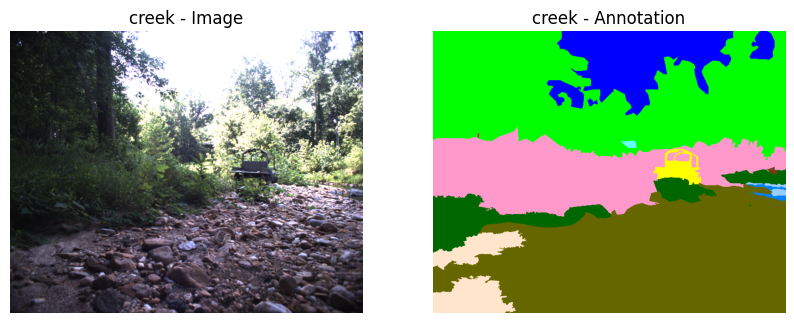


Displaying image-annotation pair from 'park-1'...


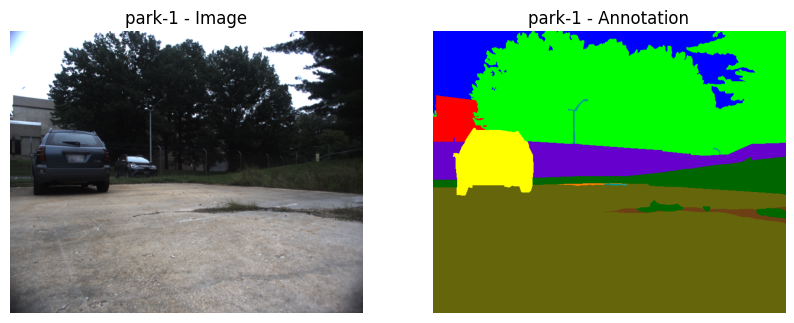


Displaying image-annotation pair from 'park-2'...


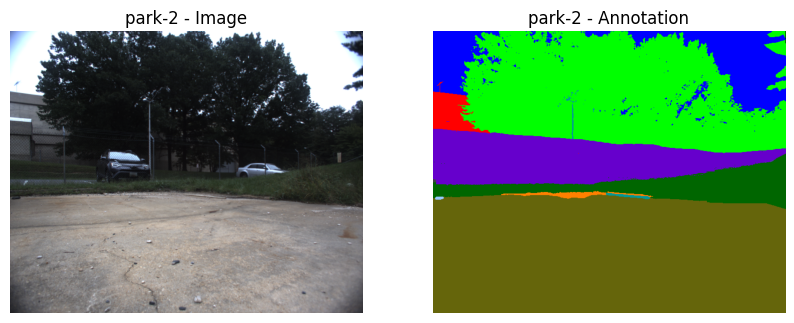


Displaying image-annotation pair from 'park-8'...


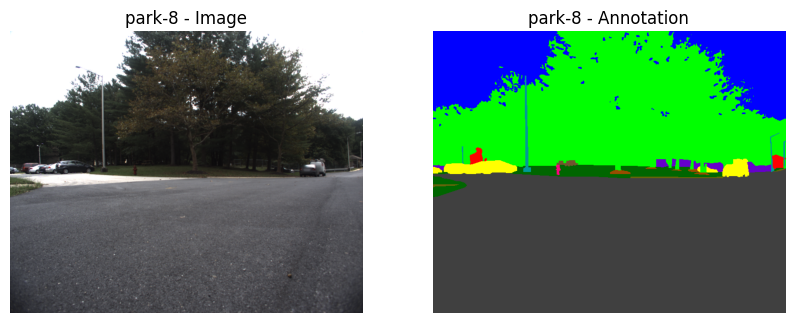


Displaying image-annotation pair from 'trail'...


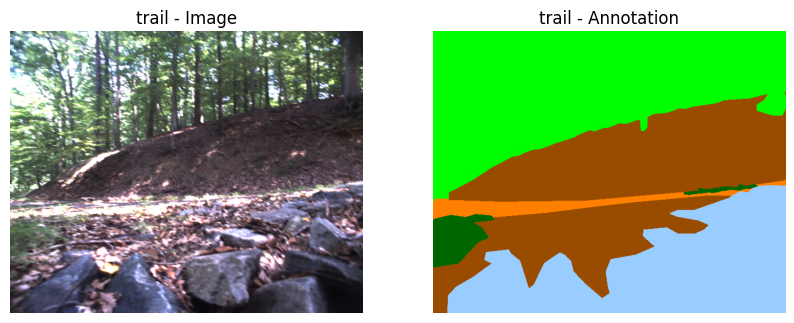


Displaying image-annotation pair from 'trail-10'...


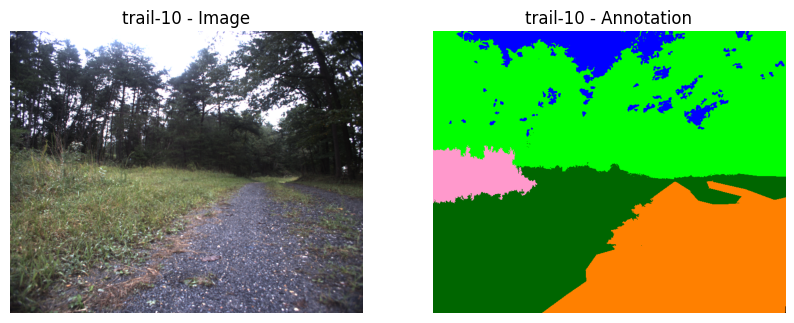


Displaying image-annotation pair from 'trail-11'...


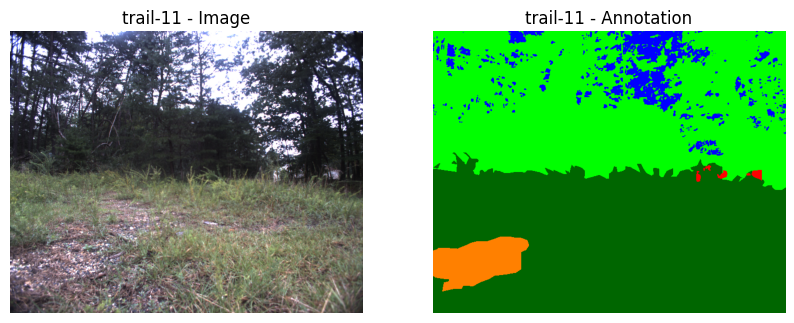


Displaying image-annotation pair from 'trail-12'...


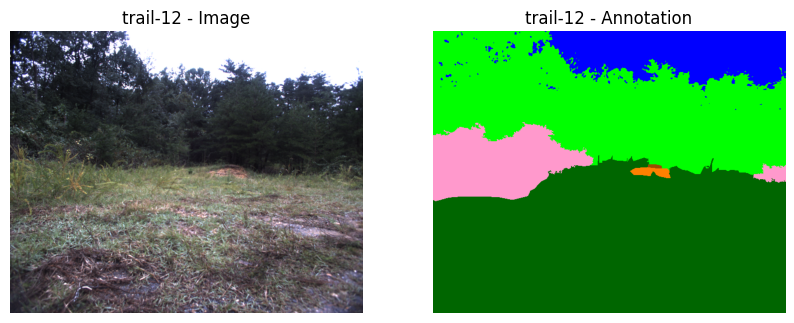


Displaying image-annotation pair from 'trail-13'...


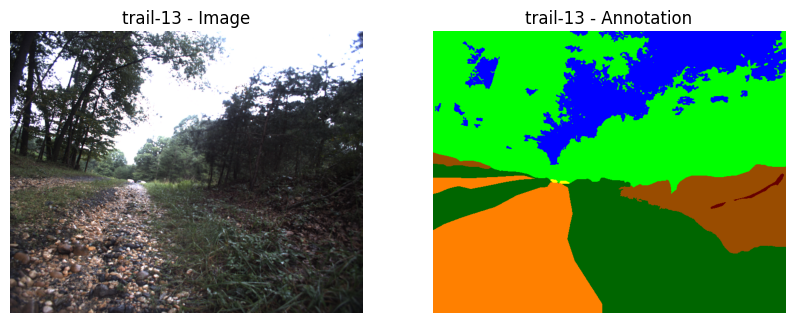


Displaying image-annotation pair from 'trail-14'...


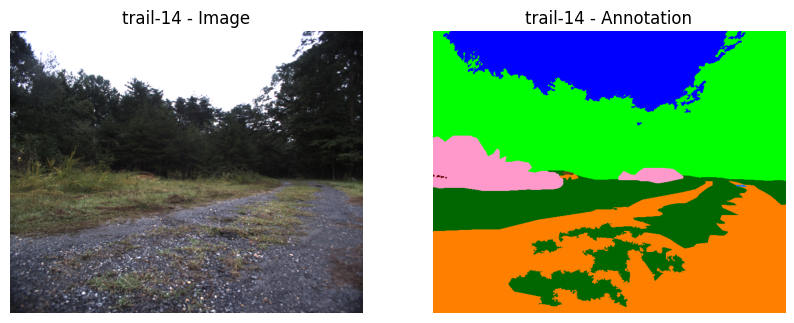


Displaying image-annotation pair from 'trail-15'...


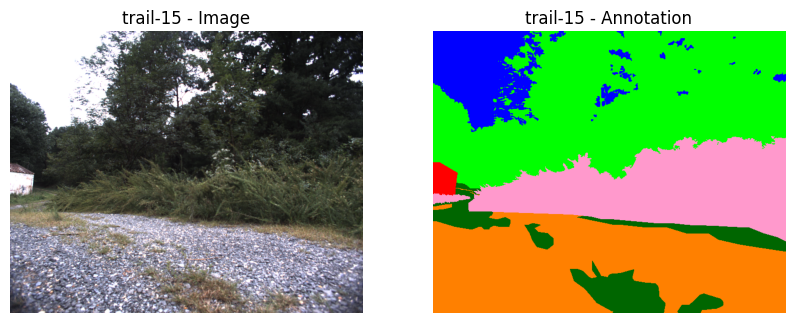


Displaying image-annotation pair from 'trail-3'...


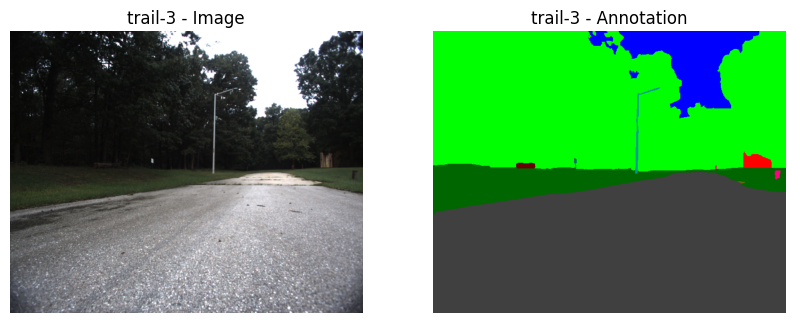


Displaying image-annotation pair from 'trail-4'...


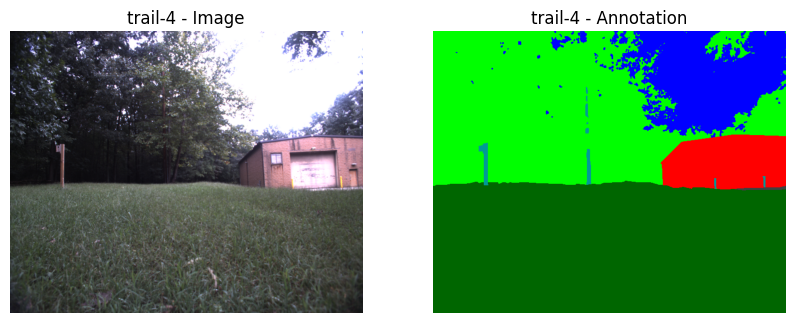


Displaying image-annotation pair from 'trail-5'...


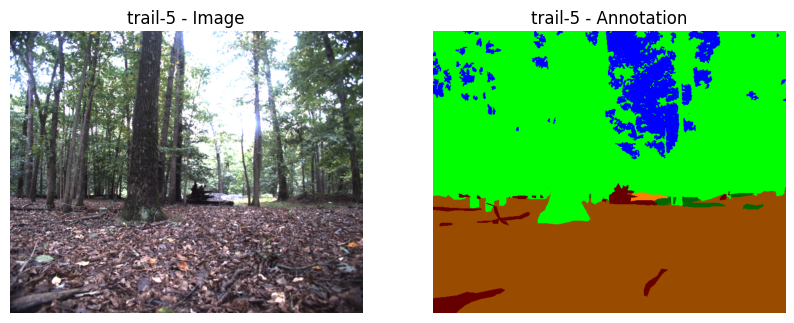


Displaying image-annotation pair from 'trail-6'...


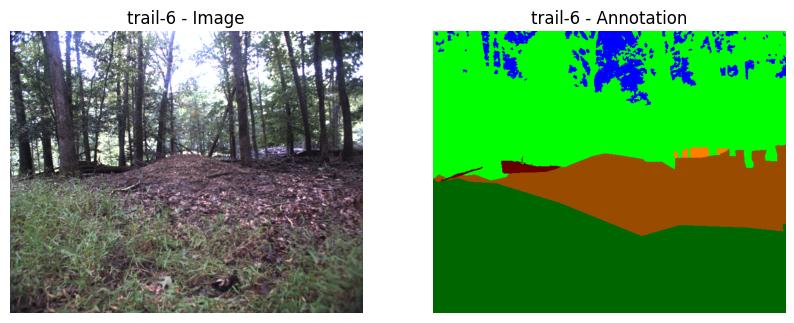


Displaying image-annotation pair from 'trail-7'...


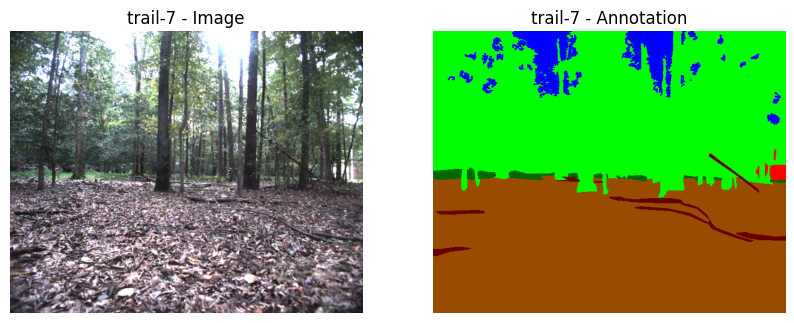


Displaying image-annotation pair from 'trail-9'...


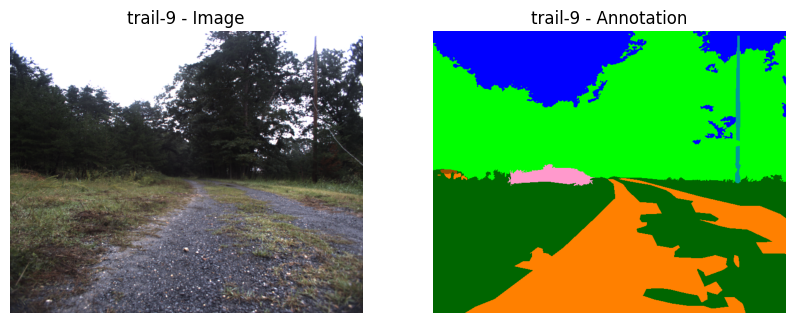


Displaying image-annotation pair from 'village'...


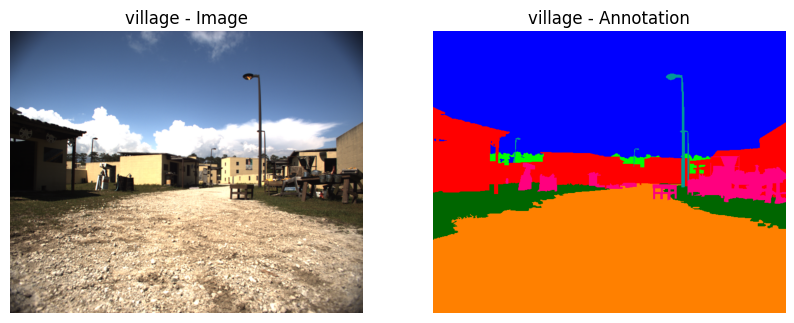

In [6]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Paths to the main directories
frames_dir = './RUGD_frames-with-annotations'
annotations_dir = './RUGD_annotations'

# Iterate over each subfolder in the frames directory
for subfolder in os.listdir(frames_dir):
    frame_subfolder_path = os.path.join(frames_dir, subfolder)
    annotation_subfolder_path = os.path.join(annotations_dir, subfolder)

    # Ensure both are directories and exist in both frames and annotations
    if os.path.isdir(frame_subfolder_path) and os.path.isdir(annotation_subfolder_path):
        print(f"\nDisplaying image-annotation pair from '{subfolder}'...")

        # Find the first image file in the frames subfolder
        image_file = None
        for file in os.listdir(frame_subfolder_path):
            if file.endswith('.png'):
                image_file = file
                break

        # If we found an image file, find the corresponding annotation
        if image_file:
            image_path = os.path.join(frame_subfolder_path, image_file)
            annotation_path = os.path.join(annotation_subfolder_path, image_file)

            # If both the image and annotation files exist
            if os.path.exists(image_path) and os.path.exists(annotation_path):
                # Load and display the image and annotation side by side
                image = Image.open(image_path)
                annotation = Image.open(annotation_path)

                fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                axes[0].imshow(image)
                axes[0].set_title(f"{subfolder} - Image")
                axes[0].axis("off")
                axes[1].imshow(annotation)
                axes[1].set_title(f"{subfolder} - Annotation")
                axes[1].axis("off")
                plt.show()

The final step of our exploratory data analysis verifying the pixel distribution shown in the dataset paper. The paper provided the following plot highlighting the distribution between classes in the dataset.

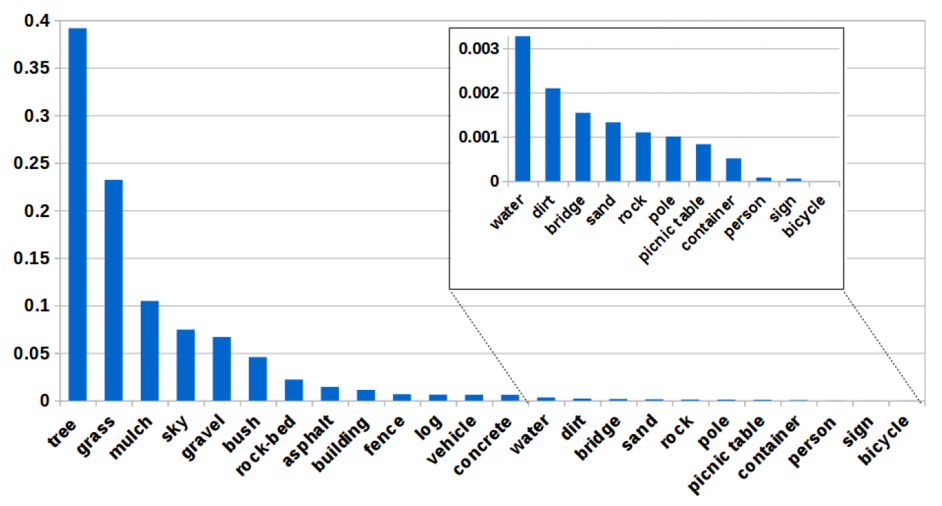

By running the following code, we produced similar plots to verify this distribution, as shown below.

In [ ]:
# Define the number of classes in the dataset
num_classes = 25

# Initialize a tensor to store pixel counts for each class on the GPU (if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
class_pixel_counts = torch.zeros(num_classes, dtype=torch.long, device=device)

i = 0

# Loop through the dataset and accumulate pixel counts for each class
for _, masks in train_loader:
    
    i += 1
    masks = masks.to(device)  # Move masks to the GPU if available
    print(f"Processing batch {i}/{len(train_loader)}")
    
    # Flatten the mask and use bincount to count each class
    class_counts = torch.bincount(masks.flatten(), minlength=num_classes)
    class_pixel_counts += class_counts  # Accumulate counts

# Convert counts to percentages
total_pixels = class_pixel_counts.sum().item()
class_percentages = (class_pixel_counts / total_pixels).cpu().numpy()  # Move back to CPU for plotting

# Print the total number of pixels per class
print("Total pixel counts for each class (training set):")
for cls in range(num_classes):
    print(f"Class {cls} ({class_map[cls]}): {class_pixel_counts[cls].item()} pixels")

# Plot the distribution
classes = list(range(num_classes))
percentages = [class_percentages[cls] for cls in classes]

plt.figure(figsize=(12, 6))
plt.bar(classes, percentages)
plt.xticks(classes, [f"Class {i} ({class_map[i]})" for i in classes], rotation=45)
plt.ylabel("Percentage of Pixels")
plt.title("Class Distribution of Pixel Annotations (Training Set)")

plt.show()

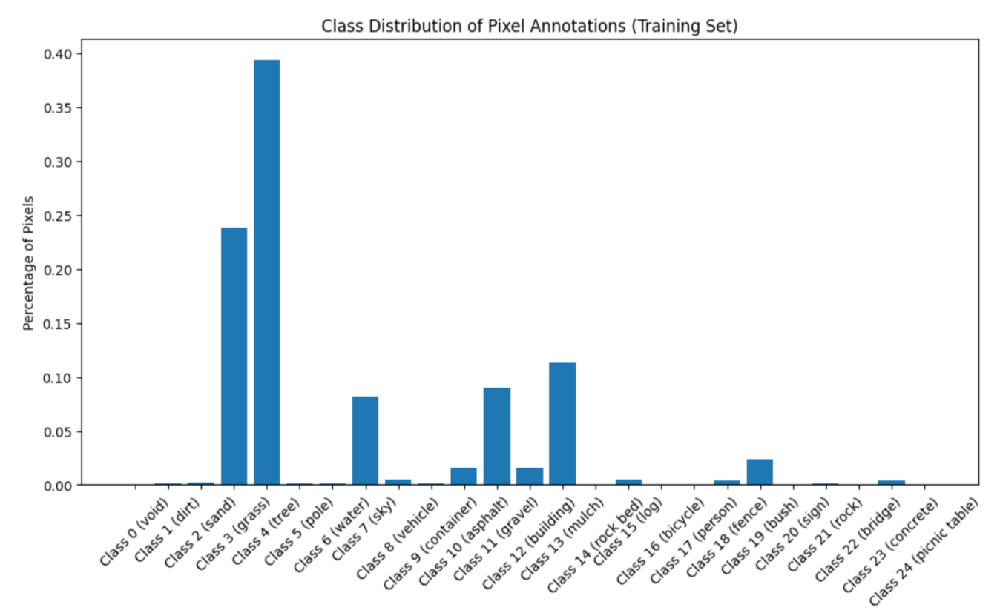




This plot verifies that the distribution in the dataset is highly uneven, with very few classes taking up most of the pixel count. This plot informs us that we will need to implement some class rebalancing methods in our models.

Now that we have a good understanding of how the data is structured, let's begin discussing models and methods we can use to apply this dataset to the problem of semantic segmentation in unstructured environments.

# 4. Models and Methods

As mentioned in the introduction, our overall approach to the problem will be as follows:

- First, we will split up the dataset according to the split prodived in the RUGD dataset paper, and will train these image-annotation pairs on three baseline models. We will evaluate the models on the test-set, and identify which of the three baselines performed best.

- Next, the best-performing of these baselines will be adopted for further development, and various optimisation methods, such as hyperparameter tuning, architecture enhancements (ASPP modules), class-aware loss weighting, and multiple data augmentation techniques, will be trialed individually.

- Of these optimisation methods, the ones that demonstrated performance improvements (i.e., improved the results of the chosen baseline model) will be combined and adopted in a final model.

This section will explore the theoretical motivation and basis of each of the above steps, and the experimental setup and results sections will demonstrate the code needed to implement these models / methods. Section 4.1 will explore the 3 baseline models chosen, and Sections 4.2 to 4.5 will explore the various optimisation methods tested. Each of these subheadings (e.g., Baseline Models, Hyperparameter Tuning) will have corresponding subheadings in Section 5 with the code implementation.

# 4.1. Baseline Models

# 4.1.1. ResNet50 + UNet

U-Net is a well-established architecture for many semantic segmentation tasks, including those in complex outdoor scenes. It is a fully convolutional network with encoder and decoder blocks, compressing images down to lower dimensional representations before reconstructing them to full size for pixel-wise predictions. It also uses skip connections, where images in the encoder block are copied and fed into the corresponding step in the decoder block. This is done to help the model retain spatial information, meaning crucial details aren’t lost during the upsampling process, which is particularly important in complex unstructured scenes like those in our dataset. Therefore, we chose U-Net as our first baseline model, with a ResNet50 backbone to provide the model with feature extraction capabilities.

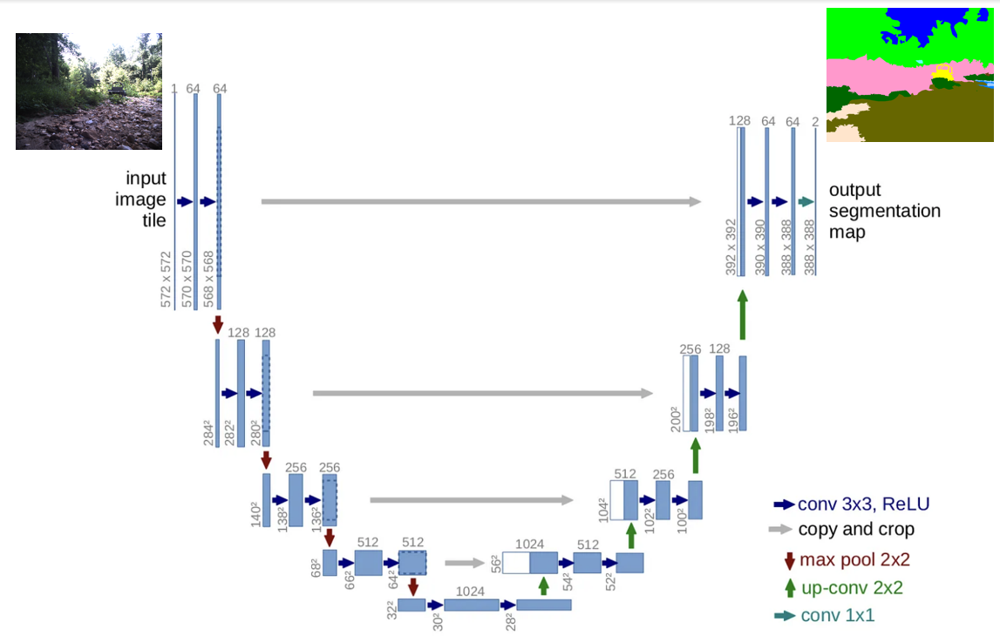


# 4.1.2. ResNet50 with Dilated Convolutions + PSPNet

Pyramid Scene Parsing Network is a semantic segmentation model that uses a novel pyramidal pooling module after the encoder. This module consists of several convolutional layers with varied sizes that pools the feature maps, creating new feature maps that adds global and local context. The new feature maps are interpolated to match the output size and concatenated with the original feature maps, increasing global context information and hence pixel-level accuracy. A dilated convolution value of 8 is used, which is the gaps between each stride in the convolution stage. This allows the model to get a wider context of what is happening in the image. We chose this architecture for our second baseline model.

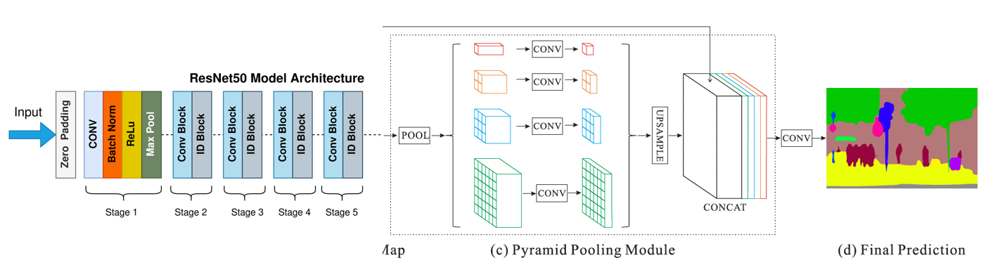

# 4.1.3. ResNet50 with Dilated Convolutions + PSPNet with Deep Supervision

Our third baseline model incorporates an additional deep supervision module into the convolutional network introduced in Section 4.1.2. Deep supervision increases information flow from the encoder to the decoder by adding additional skip connections. This technique also attaches an additional loss function to the outputs of the hidden layer, enabling the gradients to be directly back-propagated to the earlier layers of the network.  Two skip connections were added to the second and third layer of the PSPNet with 2D convolutional layer.

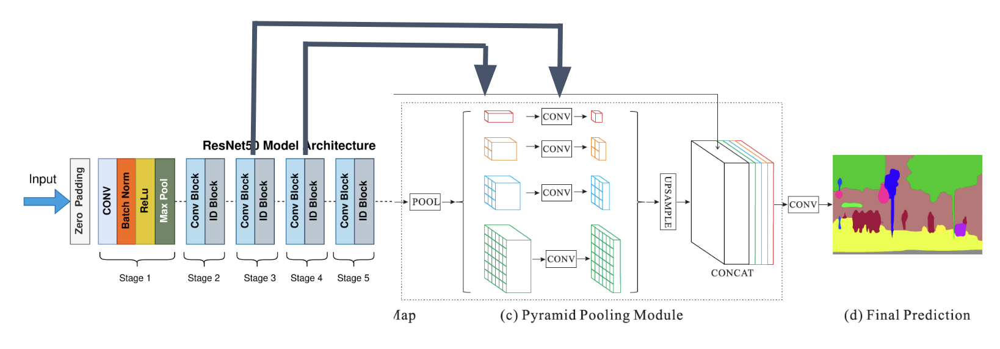

# 4.2. Hyperparameter Tuning

Following the implementation of our 3 baseline models, the first optimisation strategy we chose to employ was hyperparameter tuning. This was done for the key parameters of learning rate, batch number, momentum, and weight decay. 

The original parameters employed for each of the baselines were taken from the RUGD paper and are as follows: 

Learning rate = 0.01

Batch size = 8

Momentum = 0.9

Weight decay = 0.001 

Random search across all these hyperparameters was then used to establish trends and see how they can be adjusted to improve model performance.

# 4.3. ASPP Module

Next, we chose to add architecture tweaks to our chosen baseline, specifically, Atrous Spacing Pyramidal Pooling (ASPP) modules. ASPP modules are used to pool multiple convolution layers with dilated strides into a single input for the next layer. This allows the convolutional neural network to identify key features in the image at a larger context. We tested adding ASPP modules of 3, 4, and 5 convolutional layers to our chosen baseline model, with dilation rates  of 6, 12, 18, and 24. This module is added to the input of the encoder.

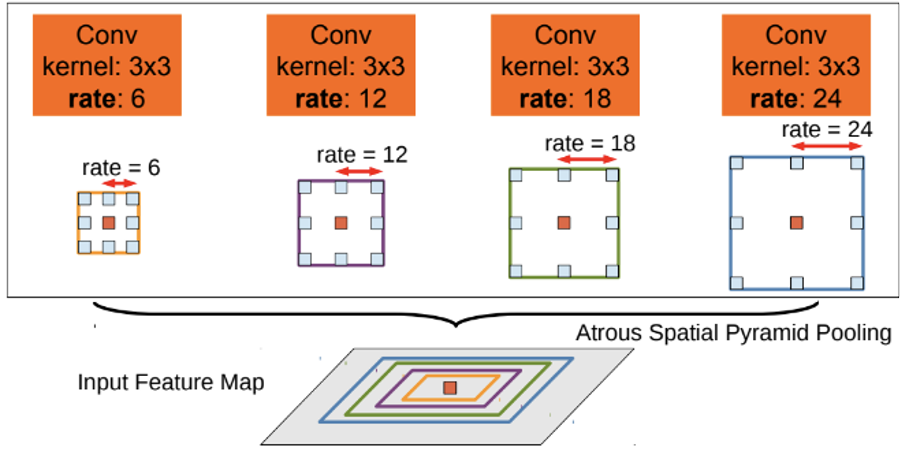

# 4.4. Data Augmentation

Next, we chose to employ a series of data augmentation techniques. As observed in the data exploration stage, the dataset is very skewed towards certain classes, with some classes being highly represented and others being almost absent entirely. As we will see in the results section of this notebook, this class imbalance was causing all baseline models to perform much better on certain classes as opposed to others. For example, a model might successfully predict tree pixels 90% of the time, but will achieve accuracies of close to 0% on less-represented classes. We figured that if we could find ways to balance the class distribution, our models would perform equally well across all classes, potentially improving the overall performance.

# 4.4.1. Cropping and Resizing

Our first data augmentation technique was a cropping and resizing algorithm we designed. This method involves locating connected regions of rare classes, generating minimum bounding boxes around them, upsizing them to full-sized images, and adding them into the training set. The image below shows an example of some bouding boxes that would be generated if we set the desired class for enhancement to Buildings (Red). Note that we designed our algorithm to focus on and enhance representation of any number of desired classes.

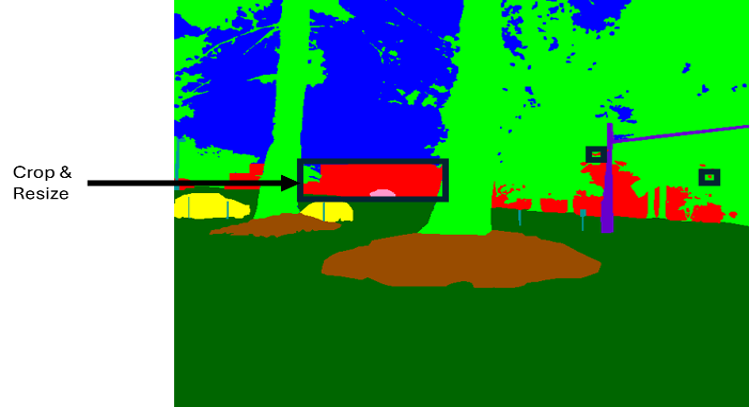

# 4.4.2. CutMix + StickerMix

The next data augmentation approach we trialed was CutMix, a technique introduced in 2019 that involves pasting a part of one image at the same location in another image, and updating the corresponding mask labels accordingly. We decided to try a variation of this, where we extract regions of rare classes only, and paste them onto other images. We first implemented this by cropping rectangular sections of rare classes, scaling them all to the same size, and then pasting them in fixed locations on other images. See below an example of what a CutMix-enhanced mask would look like in our implementation.

<div style="text-align: center;">
    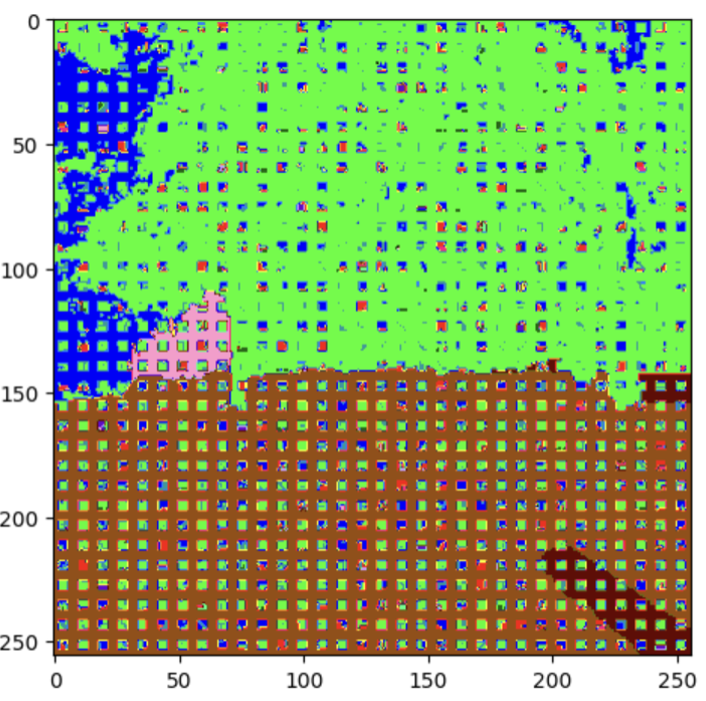
</div>

Extending upon CutMix, we also introduced a completely novel method, which we are calling StickerMix, to more effectively balance class distributions. The motivation for this method came from some limitations of CutMix, which we will discuss in the results section of this notebook.

StickerMix involves first locating connected regions of rare classes, as discussed in Section 4.4.1, and saving them in a ‘sticker book’. Then, we paste some number of stickers of desired classes at their original size in random locations on copies of existing images in the training set, and add these new sticker-augmented copies to the training set. By selecting the appropriate classes and the right number of stickers pasted per image, class distributions should balance and overall model performance should improve.

<div style="text-align: center;">
    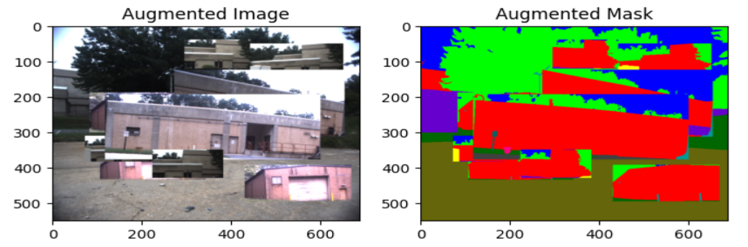
</div>

# 4.5. Class-Aware Loss Weighting

Another method we tested to address the class imbalance was class-aware loss weighting. In this method, weights are assigned to each class based on their representation in the distribution, and these weights are considered when the loss is calculated after each training batch. Increasing the weights of low-frequency classes increases their importance in the loss function, hopefully improving overall model performance.

We evaluated several formulas to determine class weights: Inverse Weighting, Recall Loss, and Logit Inverse Weighting.

# 4.6. Final Model

As mentioned previously, the final model will be made up of a combination of the above optimisation strategies. Section 5.6 will outline, based on their successes / failures, which strategies will be included.

# 5. Experimental Setup

This section includes the details of, and code for, preprocessing the data, training models, and evaluating models on various metrics.

# 5.1. Preprocessing Code

Before training any models, we preprocessed the data based on our understanding of the dataset obtained through the data exploration process. Preprocessing involved things like loading in the data, creating functionality to make any changes needed to the data, and writing dataset classes to handle data in different training splits and provide functionality for our DataLoader in subsequent steps.

Unless specified otherwise, each of the models and methods made use of the preprocessing code provided in this section.

First, we set a seed to ensure reproducibility of results to ensure a fair comparison between baselines and optimisation strategies.

In [ ]:
import torch
import numpy as np
import random
import os

# Set a fixed seed for reproducibility
seed = 42 

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)  
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# ensure reproducibility in dataloader
os.environ['PYTHONHASHSEED'] = str(seed)

def seed_worker(worker_id):
    worker_seed = seed + worker_id
    np.random.seed(worker_seed)
    random.seed(worker_seed)
    torch.manual_seed(worker_seed)

Next, we defined two dictionaries for mapping RGB values to classes, and class numbers to class labels, to assist with implementation of our methods.

In [ ]:
import numpy as np

# Define colour map to handle text from colour map text file
colour_map = {
    (0, 0, 0): 0,           # void
    (108, 64, 20): 1,       # dirt
    (255, 229, 204): 2,     # sand
    (0, 102, 0): 3,         # grass
    (0, 255, 0): 4,         # tree
    (0, 153, 153): 5,       # pole
    (0, 128, 255): 6,       # water
    (0, 0, 255): 7,         # sky
    (255, 255, 0): 8,       # vehicle
    (255, 0, 127): 9,       # container/generic-object
    (64, 64, 64): 10,       # asphalt
    (255, 128, 0): 11,      # gravel
    (255, 0, 0): 12,        # building
    (153, 76, 0): 13,       # mulch
    (102, 102, 0): 14,      # rock-bed
    (102, 0, 0): 15,        # log
    (0, 255, 128): 16,      # bicycle
    (204, 153, 255): 17,    # person
    (102, 0, 204): 18,      # fence
    (255, 153, 204): 19,    # bush
    (0, 102, 102): 20,      # sign
    (153, 204, 255): 21,    # rock
    (102, 255, 255): 22,    # bridge
    (101, 101, 11): 23,     # concrete
    (114, 85, 47): 24       # picnic-table
}

class_map = {
    0: 'void',        
    1: 'dirt',       
    2: 'sand',     
    3: 'grass',         
    4: 'tree',         
    5: 'pole',       
    6: 'water',       
    7: 'sky',         
    8: 'vehicle',       
    9: 'container',       
    10: 'asphalt',       
    11: 'gravel',      
    12: 'building',        
    13: 'mulch',       
    14: 'rock bed',      
    15: 'log',        
    16: 'bicycle',      
    17: 'person',    
    18: 'fence',      
    19: 'bush',    
    20: 'sign',      
    21: 'rock',    
    22: 'bridge',    
    23: 'concrete',     
    24: 'picnic table' 
}

Next, we defined a dataset class.

Instances of the dataset class will be used to load training, validation, and testing datasets. Descriptions of each of the methods in the class are as follows.


**__init__(self, image_dir, annotation_dir, colour_map, split = 'train', transform = None, mask_transform = None)**

This constructor method intialises attributes associated with the dataset, and generates a list of image and annotation paths by calling the _get_paths() method.

**_get_paths(self)**

This method searches through each of the video sequence folders that correspond to the given split associated with the dataset (e.g. train, validation, or test), and creates a list of all the image paths and annotation paths for all images / annotations that belong to the training / validation / test set, and returns these paths.

**_rgb_to_class_index(self, annotation)**

This method takes annotation images in RGB format as an argument, uses the colour map we've defined to convert each pixel value from a 3-dimensional RGB value into its corresponding 1-dimensional class value (i.e., a value from 0 to 24), then returns the annotation now in class-form.

**__len__(self)**

Returns the length of the image paths list, giving the number of images in that data set.

**__getitem__(self, idx)**

This method is used by the DataLoader to retrieve image-annotation pairs at some index. The method loads the image and annotation in RGB-format, applies any defined transformations to them, converts the annotation back to class-form (values 0 to 24), and returns both the image and annotation.


In [ ]:
import os
from PIL import Image
from torch.utils.data import Dataset
import torch
import numpy as np
from torchvision import transforms

class RUGDDataset(Dataset):
    def __init__(self, image_dir, annotation_dir, colour_map, split='train', transform=None, mask_transform=None):
        self.image_dir = image_dir
        self.annotation_dir = annotation_dir
        self.colour_map = colour_map
        self.transform = transform
        self.mask_transform = mask_transform
        self.split = split

        # Define which sequences to use based on the split
        if self.split == 'train':
            self.sequences = ['park-2', 'trail', 'trail-3', 'trail-4', 'trail-6', 'trail-9', 'trail-10', 'trail-11', 'trail-12', 'trail-14', 'trail-15', 'village']
        elif self.split == 'val':
            self.sequences = ['park-8', 'trail-5']
        elif self.split == 'test':
            self.sequences = ['creek', 'park-1', 'trail-7', 'trail-13']

        # Get all matched image and annotation paths
        self.image_paths, self.annotation_paths = self._get_paths()

    def _get_paths(self):
        image_paths = []
        annotation_paths = []
        valid_extensions = {".png"}

        for seq in self.sequences:
            img_seq_dir = os.path.join(self.image_dir, seq)
            ann_seq_dir = os.path.join(self.annotation_dir, seq)

            # Get all valid image files in each directory
            img_files = {f for f in os.listdir(img_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}
            ann_files = {f for f in os.listdir(ann_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}

            # Intersect file sets to get matching files by name
            common_files = img_files.intersection(ann_files)
            
            for file_name in sorted(common_files):
                image_paths.append(os.path.join(img_seq_dir, file_name))
                annotation_paths.append(os.path.join(ann_seq_dir, file_name))

        return image_paths, annotation_paths

    def _rgb_to_class_index(self, annotation):
        annotation_np = np.array(annotation)
        mask = np.zeros(annotation_np.shape[:2], dtype=np.int64)
        for rgb, idx in self.colour_map.items():
            mask[(annotation_np == rgb).all(axis=-1)] = idx
        return torch.from_numpy(mask)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):      
        # Load image and annotation
        image = Image.open(self.image_paths[idx]).convert('RGB')
        annotation = Image.open(self.annotation_paths[idx]).convert('RGB')     

        # Apply transform to image if provided
        if self.transform:
            image = self.transform(image)

        # Apply mask transform if provided
        if self.mask_transform:
            annotation = self.mask_transform(annotation)

        # Convert annotation to class index mask
        annotation = self._rgb_to_class_index(annotation)
        
        return image, annotation

Next, we define the transformations we will be applying to the image-annotation pairs before they are trained on our baseline models, create the training, validation, and testing datasets, and their corresponding DataLoaders.

The normalization parameters (mean and standard deviation values) are taken from ImageNet, as our models use a backbone pre-trained on the ImageNet dataset.

Note that we resize images to 256 x 256 for computational efficiency due to the limited GPU resources available to us in this project.

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader

# Define transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


# Define mask transformation to resize to 256x256
mask_transform = transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.NEAREST)

# Load datasets
train_dataset = RUGDDataset(
    image_dir='/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_frames-with-annotations/RUGD_frames-with-annotations',  
    annotation_dir='/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_annotations/RUGD_annotations',  
    colour_map=colour_map,
    split='train',
    transform=transform,
    mask_transform=mask_transform 
)

val_dataset = RUGDDataset(
    image_dir='/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_frames-with-annotations/RUGD_frames-with-annotations',  
    annotation_dir='/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_annotations/RUGD_annotations', 
    colour_map=colour_map,
    split='val',
    transform=transform,
    mask_transform=mask_transform
)

test_dataset = RUGDDataset(
    image_dir='/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_frames-with-annotations/RUGD_frames-with-annotations',  
    annotation_dir='/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_annotations/RUGD_annotations', 
    colour_map=colour_map,
    split='test',
    transform=transform,
    mask_transform=mask_transform
)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers = 4, worker_init_fn=seed_worker)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers = 4, worker_init_fn=seed_worker)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers = 4, worker_init_fn=seed_worker)

Next, we take a sample batch from the training set DataLoader to confirm that things like batch size, image shape, mask shape, and image and mask values are as we expected.

In [ ]:
# Get a single batch from the train_loader
sample_batch = next(iter(train_loader))

# Separate the lists of images and masks
images, masks = sample_batch

# Print the shape of the entire batch
print("Batch size:", len(images))  

# Print the shape of the first image and mask in the batch
print("First image shape:", images[0].shape)
print("First mask shape:", masks[0].shape)

# Print the tensors of the first image and mask in the batch
print("First image tensor:", images[0])
print("First mask tensor:", masks[0])

Now we are ready to train our baseline models on these datasets.

# 5.2. Training Code

For each of our baseline models and optimisation strategies, we used the same code for training our models, only occasionally changing parameters for different instances. So as to not display the same code block multiple times, we have chosen to only display one example of this training code below, along with its corresponding outputs. The below training loop and outputs correspond to the training of our U-Net baseline model. This training loop runs for 50 epochs and implements early stopping.

In [9]:
import torch
import torch.optim as optim
import torch.nn.functional as F
from tqdm import tqdm

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Move the model to the chosen device
model = model.to(device)
# Define optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()


# Initialize early stopping variables
min_val_loss = float('inf')
not_improve_count = 0
patience = 7  # Set patience level for early stopping


# Training loop
num_epochs = 50
train_loss_history = []
val_loss_history = []
train_acc_history = [] 
val_acc_history = []    

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    correct_train = 0
    total_train = 0

    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
        images, masks = images.to(device), masks.to(device)
        
        # Forward pass
        outputs = model(images)

        # Compute loss
        loss = criterion(outputs, masks)

        # Calculate accuracy
        preds = torch.argmax(outputs, dim = 1)
        correct_train += (preds == masks).sum().item()
        total_train += masks.numel()
        
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Track loss
        epoch_loss += loss.item()

    # Compute training accuracy for the epoch
    train_accuracy = correct_train / total_train
    train_acc_history.append(train_accuracy)

    # Print average loss for the epoch
    avg_loss = epoch_loss / len(train_loader)
    train_loss_history.append(avg_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # Validation step
    model.eval()
    val_loss = 0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)
            val_loss += loss.item()

            # Calculate accuracy
            preds = torch.argmax(outputs, dim=1)
            correct_val += (preds == masks).sum().item()
            total_val += masks.numel()
    
    # Compute validation accuracy for the epoch
    val_accuracy = correct_val / total_val
    val_acc_history.append(val_accuracy)
    
    
    avg_val_loss = val_loss / len(val_loader)
    val_loss_history.append(avg_val_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}], Validation Loss: {avg_val_loss:.4f}")

    # Early stopping check
    if avg_val_loss < min_val_loss:
        not_improve_count = 0
        min_val_loss = avg_val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        print(f"Validation loss decreased to {min_val_loss:.4f}, saving model.")
    else:
        not_improve_count += 1
        print(f"Loss did not decrease for {not_improve_count} time(s)")

        if not_improve_count >= patience:
            print(f"Early stopping triggered after {patience} epochs without improvement.")
            break

Epoch 1/50: 100%|██████████| 598/598 [02:51<00:00,  3.49it/s]

Epoch [1/50], Loss: 0.6598


Epoch [1/50], Validation Loss: 0.4465
Validation loss decreased to 0.4465, saving model.


Epoch 2/50: 100%|██████████| 598/598 [02:43<00:00,  3.66it/s]

Epoch [2/50], Loss: 0.4274


Epoch [2/50], Validation Loss: 0.3749
Validation loss decreased to 0.3749, saving model.


Epoch 3/50: 100%|██████████| 598/598 [02:43<00:00,  3.66it/s]

Epoch [3/50], Loss: 0.3814


Epoch [3/50], Validation Loss: 0.4397
Loss did not decrease for 1 time(s)


Epoch 4/50: 100%|██████████| 598/598 [02:43<00:00,  3.66it/s]

Epoch [4/50], Loss: 0.3545


Epoch [4/50], Validation Loss: 0.4574
Loss did not decrease for 2 time(s)


Epoch 5/50: 100%|██████████| 598/598 [02:42<00:00,  3.67it/s]

Epoch [5/50], Loss: 0.3290


Epoch [5/50], Validation Loss: 0.4195
Loss did not decrease for 3 time(s)


Epoch 6/50: 100%|██████████| 598/598 [02:43<00:00,  3.65it/s]

Epoch [6/50], Loss: 0.3099


Epoch [6/50], Validation Loss: 0.3495
Validation loss decreased to 0.3495, saving model.


Epoch 7/50: 100%|██████████| 598/598 [02:43<00:00,  3.66it/s]

Epoch [7/50], Loss: 0.2947


Epoch [7/50], Validation Loss: 0.3488
Validation loss decreased to 0.3488, saving model.


Epoch 8/50: 100%|██████████| 598/598 [02:43<00:00,  3.66it/s]

Epoch [8/50], Loss: 0.2890


Epoch [8/50], Validation Loss: 0.3486
Validation loss decreased to 0.3486, saving model.


Epoch 9/50: 100%|██████████| 598/598 [02:45<00:00,  3.61it/s]

Epoch [9/50], Loss: 0.2750


Epoch [9/50], Validation Loss: 0.3692
Loss did not decrease for 1 time(s)


Epoch 10/50: 100%|██████████| 598/598 [02:44<00:00,  3.63it/s]

Epoch [10/50], Loss: 0.2639


Epoch [10/50], Validation Loss: 0.3878
Loss did not decrease for 2 time(s)


Epoch 11/50: 100%|██████████| 598/598 [02:44<00:00,  3.63it/s]

Epoch [11/50], Loss: 0.2618


Epoch [11/50], Validation Loss: 0.3762
Loss did not decrease for 3 time(s)


Epoch 12/50: 100%|██████████| 598/598 [02:45<00:00,  3.61it/s]

Epoch [12/50], Loss: 0.2444


Epoch [12/50], Validation Loss: 0.3692
Loss did not decrease for 4 time(s)


Epoch 13/50: 100%|██████████| 598/598 [02:48<00:00,  3.55it/s]

Epoch [13/50], Loss: 0.2406


Epoch [13/50], Validation Loss: 0.3412
Validation loss decreased to 0.3412, saving model.


Epoch 14/50: 100%|██████████| 598/598 [02:44<00:00,  3.63it/s]

Epoch [14/50], Loss: 0.2277


Epoch [14/50], Validation Loss: 0.3691
Loss did not decrease for 1 time(s)


Epoch 15/50: 100%|██████████| 598/598 [02:47<00:00,  3.57it/s]

Epoch [15/50], Loss: 0.2312


Epoch [15/50], Validation Loss: 0.4663
Loss did not decrease for 2 time(s)


Epoch 16/50: 100%|██████████| 598/598 [02:46<00:00,  3.60it/s]

Epoch [16/50], Loss: 0.2298


Epoch [16/50], Validation Loss: 0.3471
Loss did not decrease for 3 time(s)


Epoch 17/50: 100%|██████████| 598/598 [02:45<00:00,  3.61it/s]

Epoch [17/50], Loss: 0.2196


Epoch [17/50], Validation Loss: 0.3610
Loss did not decrease for 4 time(s)


Epoch 18/50: 100%|██████████| 598/598 [02:44<00:00,  3.63it/s]

Epoch [18/50], Loss: 0.2025


Epoch [18/50], Validation Loss: 0.3770
Loss did not decrease for 5 time(s)


Epoch 19/50: 100%|██████████| 598/598 [02:44<00:00,  3.64it/s]

Epoch [19/50], Loss: 0.2043


Epoch [19/50], Validation Loss: 0.3750
Loss did not decrease for 6 time(s)


Epoch 20/50: 100%|██████████| 598/598 [02:45<00:00,  3.62it/s]

Epoch [20/50], Loss: 0.2028


Epoch [20/50], Validation Loss: 0.3479
Loss did not decrease for 7 time(s)
Early stopping triggered after 7 epochs without improvement.
Model saved to /kaggle/working/model_checkpoint.pth


# 5.3. Testing Code

Again, the code used for making predictions with our models and calculating various evaluation metrics was the same across all baselines and optimisation strategies, so we've only included it once, below, so as to not repeat the same code. The code makes use of some evaluation metrics from torch such as MulticlassJaccardIndex and MulticlassAccuracy to calculate metrics such as pixel accuracy and mean Intersection over Union (IoU), and excludes some classes (0, 16, and 22) from calculations, as these clases are either void or were not present in the training / test set.

All models were tested on both the validation set and test set.

In [11]:
import torch
from torchmetrics.classification import MulticlassJaccardIndex, MulticlassAccuracy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize metrics for 25 classes
num_classes = 25
iou_metric = MulticlassJaccardIndex(num_classes=num_classes, average=None).to(device)  # Per-class IoU
pixel_accuracy_metric = MulticlassAccuracy(num_classes=num_classes, average='micro').to(device)  # Pixel Accuracy
per_class_accuracy_metric = MulticlassAccuracy(num_classes=num_classes, average=None).to(device)  # Per-class accuracy

# Specify the classes to exclude from the mean pixel accuracy and mean IoU
exclude_classes = [0, 16, 22]

model.eval()

# Evaluation loop
iou_scores = []
pixel_accuracies = []
per_class_accuracies = []

with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        outputs = model(images)
        predictions = torch.argmax(outputs, dim=1)  # Get predicted class for each pixel

        # Calculate metrics
        iou_scores.append(iou_metric(predictions, masks))
        pixel_accuracies.append(pixel_accuracy_metric(predictions, masks))
        per_class_accuracies.append(per_class_accuracy_metric(predictions, masks))

iou_scores = torch.stack(iou_scores).mean(0)  # Per-class IoU
pixel_accuracy = torch.stack(pixel_accuracies).mean().item()
per_class_accuracies = torch.stack(per_class_accuracies).mean(0)  # Per-class accuracy

# Exclude specified classes from mean calculations
valid_iou_scores = [iou for i, iou in enumerate(iou_scores) if i not in exclude_classes]
valid_class_accuracies = [acc for i, acc in enumerate(per_class_accuracies) if i not in exclude_classes]

mean_iou = torch.tensor(valid_iou_scores).mean().item() * 100  # Mean IoU excluding specified classes
mean_pixel_accuracy = torch.tensor(valid_class_accuracies).mean().item() * 100  # Mean pixel accuracy excluding specified classes

# Print results
print('TEST SET\n')
print(f"Pixel Accuracy: {pixel_accuracy * 100:.2f}%")
print(f"Mean Pixel Accuracy (excluding classes {exclude_classes}): {mean_pixel_accuracy:.2f}%")
print("Per-class IoU:")
for i, iou in enumerate(iou_scores):
    print(f"Class {i} ({class_map[i]}): IoU = {iou.item() * 100:.2f}%")
print(f"Mean IoU (excluding classes {exclude_classes}): {mean_iou:.2f}%")

print("Per-class Accuracy:")
for i, acc in enumerate(per_class_accuracies):
    print(f"Class {i} ({class_map[i]}): Accuracy = {acc.item() * 100:.2f}%")

TEST SET

Pixel Accuracy: 73.81%
Mean Pixel Accuracy (excluding classes [0, 16, 22]): 17.87%
Per-class IoU:
Class 0 (void): IoU = 0.00%
Class 1 (dirt): IoU = 0.00%
Class 2 (sand): IoU = 0.94%
Class 3 (grass): IoU = 53.23%
Class 4 (tree): IoU = 80.71%
Class 5 (pole): IoU = 2.22%
Class 6 (water): IoU = 0.19%
Class 7 (sky): IoU = 70.37%
Class 8 (vehicle): IoU = 21.63%
Class 9 (container): IoU = 0.00%
Class 10 (asphalt): IoU = 4.21%
Class 11 (gravel): IoU = 10.70%
Class 12 (building): IoU = 20.67%
Class 13 (mulch): IoU = 23.10%
Class 14 (rock bed): IoU = 0.45%
Class 15 (log): IoU = 5.35%
Class 16 (bicycle): IoU = 0.00%
Class 17 (person): IoU = 0.00%
Class 18 (fence): IoU = 6.67%
Class 19 (bush): IoU = 13.48%
Class 20 (sign): IoU = 0.00%
Class 21 (rock): IoU = 0.53%
Class 22 (bridge): IoU = 0.00%
Class 23 (concrete): IoU = 5.28%
Class 24 (picnic table): IoU = 2.59%
Mean IoU (excluding classes [0, 16, 22]): 14.65%
Per-class Accuracy:
Class 0 (void): Accuracy = 0.00%
Class 1 (dirt): Accuracy 

In [12]:
import torch
from torchmetrics.classification import MulticlassJaccardIndex, MulticlassAccuracy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize metrics for 25 classes
num_classes = 25
iou_metric = MulticlassJaccardIndex(num_classes=num_classes, average=None).to(device)  # Per-class IoU
pixel_accuracy_metric = MulticlassAccuracy(num_classes=num_classes, average='micro').to(device)  # Pixel Accuracy
per_class_accuracy_metric = MulticlassAccuracy(num_classes=num_classes, average=None).to(device)  # Per-class accuracy

# Specify the classes to exclude from the mean pixel accuracy and mean IoU
exclude_classes = [0, 16, 22]

model.eval()

# Evaluation loop
iou_scores = []
pixel_accuracies = []
per_class_accuracies = []

with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        outputs = model(images)
        predictions = torch.argmax(outputs, dim=1)  # Get predicted class for each pixel

        # Calculate metrics
        iou_scores.append(iou_metric(predictions, masks))
        pixel_accuracies.append(pixel_accuracy_metric(predictions, masks))
        per_class_accuracies.append(per_class_accuracy_metric(predictions, masks))

iou_scores = torch.stack(iou_scores).mean(0)  # Per-class IoU
pixel_accuracy = torch.stack(pixel_accuracies).mean().item()
per_class_accuracies = torch.stack(per_class_accuracies).mean(0)  # Per-class accuracy

# Exclude specified classes from mean calculations
valid_iou_scores = [iou for i, iou in enumerate(iou_scores) if i not in exclude_classes]
valid_class_accuracies = [acc for i, acc in enumerate(per_class_accuracies) if i not in exclude_classes]

mean_iou = torch.tensor(valid_iou_scores).mean().item() * 100  
mean_pixel_accuracy = torch.tensor(valid_class_accuracies).mean().item() * 100  

# Print results
print('VALIDATION SET\n')
print(f"Pixel Accuracy: {pixel_accuracy * 100:.2f}%")
print(f"Mean Pixel Accuracy (excluding classes {exclude_classes}): {mean_pixel_accuracy:.2f}%")
print("Per-class IoU:")
for i, iou in enumerate(iou_scores):
    print(f"Class {i} ({class_map[i]}): IoU = {iou.item() * 100:.2f}%")
print(f"Mean IoU (excluding classes {exclude_classes}): {mean_iou:.2f}%")

print("Per-class Accuracy:")
for i, acc in enumerate(per_class_accuracies):
    print(f"Class {i} ({class_map[i]}): Accuracy = {acc.item() * 100:.2f}%")

VALIDATION SET

Pixel Accuracy: 90.09%
Mean Pixel Accuracy (excluding classes [0, 16, 22]): 20.20%
Per-class IoU:
Class 0 (void): IoU = 0.00%
Class 1 (dirt): IoU = 0.00%
Class 2 (sand): IoU = 0.00%
Class 3 (grass): IoU = 72.14%
Class 4 (tree): IoU = 90.30%
Class 5 (pole): IoU = 2.42%
Class 6 (water): IoU = 0.83%
Class 7 (sky): IoU = 67.46%
Class 8 (vehicle): IoU = 15.33%
Class 9 (container): IoU = 0.25%
Class 10 (asphalt): IoU = 13.66%
Class 11 (gravel): IoU = 23.10%
Class 12 (building): IoU = 14.51%
Class 13 (mulch): IoU = 52.65%
Class 14 (rock bed): IoU = 0.00%
Class 15 (log): IoU = 9.33%
Class 16 (bicycle): IoU = 0.00%
Class 17 (person): IoU = 0.00%
Class 18 (fence): IoU = 6.80%
Class 19 (bush): IoU = 3.84%
Class 20 (sign): IoU = 0.00%
Class 21 (rock): IoU = 1.37%
Class 22 (bridge): IoU = 0.00%
Class 23 (concrete): IoU = 0.68%
Class 24 (picnic table): IoU = 5.53%
Mean IoU (excluding classes [0, 16, 22]): 17.28%
Per-class Accuracy:
Class 0 (void): Accuracy = 0.00%
Class 1 (dirt): Acc

# 6. Results

This section will provide the code for implementing each of the methods along with the results obtained. Note that the code for training and evaluation is the same as the code provided in Section 5, aside from some minor tweaks to things like hyperparameters, and so has been excluded from this section.

# 6.1. Baseline Models

The code for implementing each baseline along with their training plots are provided in Sections 6.1.1, 6.1.2, and 6.1.3. Note that all baselines were tested with the same training code, which used 50 epochs with early stopping to ensure convergence.

The results achieved by the baseline models on the test set are compared in the table below. We see that our first baseline, U-Net, performed the best across all three key metrics (mean IoU, pixel accuracy, and mean pixel accuracy). So, U-Net was selected as our baseline model to improve with optimisation strategies in the later sections.

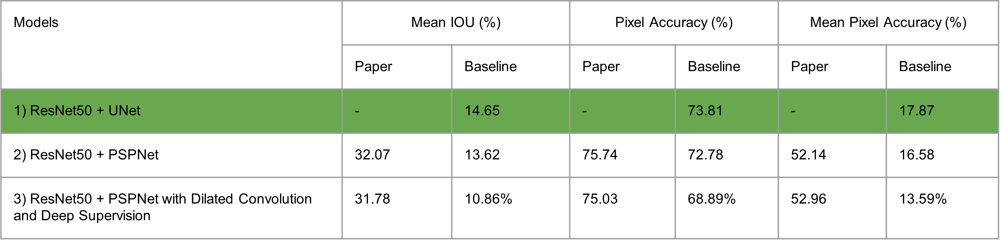


# 6.1.1. ResNet50 + UNet

The U-Net baseline was implemented using the segmentation-models.pytorch (SMP) library, with ResNet50 encoder, ImageNet encoder weights, 3 in channels, and 25 classes, as shown in the code below.

In [8]:
model = smp.Unet(
    encoder_name="resnet50",    
    encoder_weights="imagenet",   
    in_channels=3,                 
    classes=25                    
)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 280MB/s]


The training loop was implemented as shown above in Section 5.2.

See below plots of loss and accuracy on the training and validation set during traning.

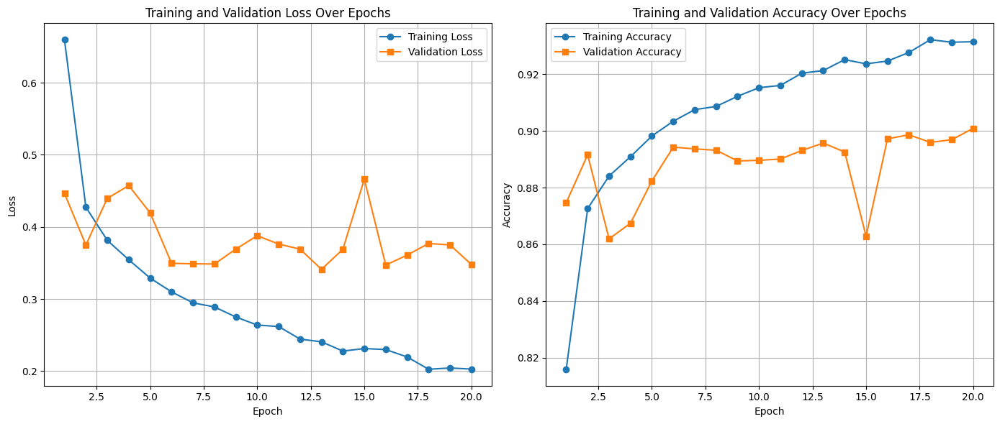

In [10]:
plt.figure(figsize=(14, 6))

# Plot loss history
plt.subplot(1, 2, 1)
epochs = range(1, len(train_loss_history) + 1)
plt.plot(epochs, train_loss_history, marker='o', label='Training Loss')
plt.plot(epochs, val_loss_history, marker='s', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.grid(True)
plt.legend()

# Plot accuracy history
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc_history, marker='o', label='Training Accuracy')
plt.plot(epochs, val_acc_history, marker='s', label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy Over Epochs')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

# 6.1.2. ResNet50 with Dilated Convolutions + PSPNet

The ResNet50 with Dilated Convolutions + PSP baseline was implemented using the code below.

In [8]:
model = smp.PSPNet(
    encoder_name='resnet50',
    encoder_weights="imagenet",
    encoder_depth=3,
    psp_out_channels=256,
    psp_use_batchnorm=True,
    psp_dropout=0.2,
    in_channels=3,
    classes=25,
    activation=None,
    upsampling=8,
    aux_params=None,
)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 299MB/s]


In [9]:
# Modify dilation rates in the backbone (e.g., on layers in the 3rd and 4th blocks)
def set_dilation(model, dilation_rates):
    # Get the layers of the ResNet encoder
    resnet_layers = list(model.encoder.children())

    # Modify the last few layers to have dilated convolutions
    for i, rate in enumerate(dilation_rates):
        layer_index = -(len(dilation_rates) - i) 
        layer = resnet_layers[layer_index] 

        # Replace the convolutions with dilated convolutions
        for module in layer.modules():
            if isinstance(module, nn.Conv2d):
                module.dilation = (rate, rate)  
                module.padding = (rate, rate) 

set_dilation(model, [8,8])

The training loop was implemented as shown above in Section 5.2.

See below plots of loss and accuracy on the training and validation set during traning.

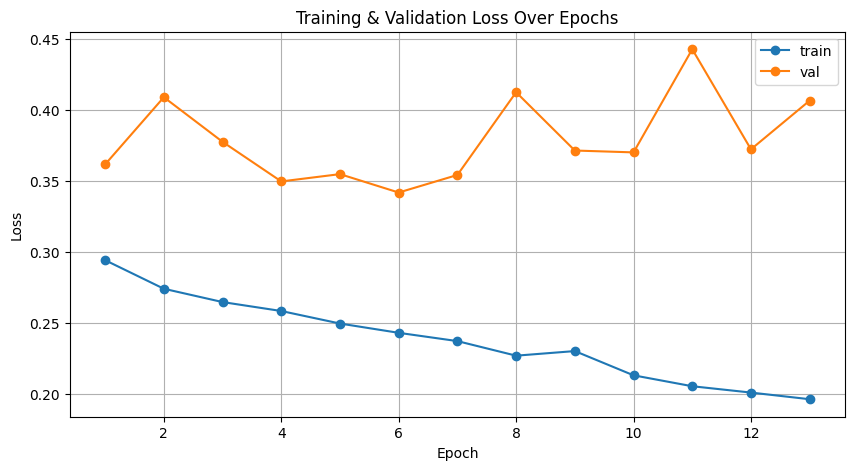

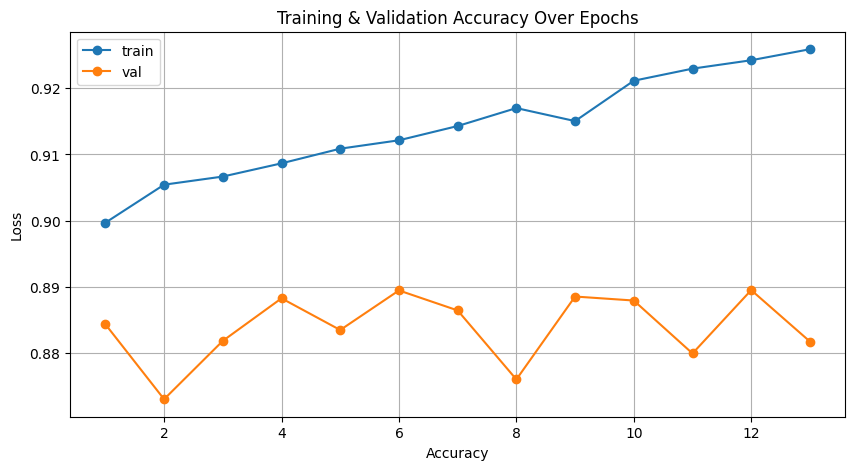

In [16]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_loss_history) + 1), train_loss_history, marker='o', label='train')
plt.plot(range(1, len(val_loss_history) + 1), val_loss_history, marker='o', label='val')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(train_accuracy_history) + 1), train_accuracy_history, marker='o', label='train')
plt.plot(range(1, len(val_accuracy_history) + 1), val_accuracy_history, marker='o', label='val')
plt.xlabel('Accuracy')
plt.ylabel('Loss')
plt.title('Training & Validation Accuracy Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

# 6.1.3. ResNet50 with Dilated Convolutions + PSPNet with Deep Supervision

The ResNet50 with Dilated Convolutions + PSP with Deep Supervision baseline was implemented using the code below.

In [9]:
class CustomResNet(nn.Module):
    def __init__(self, input_size = (256,256)):
        super(CustomResNet, self).__init__()
        # Calculate the required padding to keep dimensions consistent
        self.input_size = input_size
        # Define layers similarly as before
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=2, dilation=8)
        self.bn1 = nn.BatchNorm2d(16)
        
        # Add additional layers to match the PSPNet architecture
        self.res_block1 = self._make_residual_block(16, 16)
        self.res_block2 = self._make_residual_block(16, 32)
        self.res_block3 = self._make_residual_block(32, 64)

    def _make_residual_block(self, in_channels, out_channels, stride=1):
        """Create a residual block"""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=8, dilation=8),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=8, dilation=8),
            nn.BatchNorm2d(out_channels),
        )

    def forward(self, x):
        # Forward pass
        x1 = F.relu(self.bn1(self.conv1(x)))  # Initial Conv Layer
        identity = x1
        x1 = self.res_block1(x1) + identity  # First residual block
        x2 = self.res_block2(x1)  # Second residual block
        x3 = self.res_block3(x2)  # Third residual block
        
        # Return multiple feature maps
        return x1, x2, x3  # Outputs for PSPNet
    

In [10]:
class PSPModule(nn.Module):
    def __init__(self, in_channels, out_channels, pyramid_sizes):
        super(PSPModule, self).__init__()
        self.stages = nn.ModuleList([
            nn.Sequential(
                nn.AdaptiveAvgPool2d(size),
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ) for size in pyramid_sizes
        ])
        self.bottleneck = nn.Sequential(
            nn.Conv2d(in_channels + len(pyramid_sizes) * out_channels, out_channels, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Apply pyramid pooling
        psp_features = [x]  # Start with the original feature map
        for stage in self.stages:
            psp_features.append(F.interpolate(stage(x), size=x.size()[2:], mode='bilinear', align_corners=True))
        psp_output = torch.cat(psp_features, dim=1)
        # print(psp_output.size())
        return self.bottleneck(psp_output)

class PSPNet(nn.Module):
    def __init__(self, backbone, num_classes, psp_out_channels=512):
        super(PSPNet, self).__init__()
        self.backbone = backbone  # Your encoder, e.g., ResNet or SimpleResNet
        self.psp = PSPModule(in_channels=64, out_channels=psp_out_channels, pyramid_sizes=[1, 2, 3, 6])
        
        # Deep supervision auxiliary classifiers
        self.aux_classifier1 = nn.Conv2d(16, num_classes, kernel_size=1)  # After the first res block
        self.aux_classifier2 = nn.Conv2d(32, num_classes, kernel_size=1)  # After the second res block
        self.final_conv = nn.Conv2d(psp_out_channels, num_classes, kernel_size=1)

    def forward(self, x):
        features = self.backbone(x)  # Get features from the encoder
        main_output = self.final_conv(self.psp(features[-1]))  # Pass the last feature map through the PSP module

        # Auxiliary outputs for deep supervision
        aux_output1 = self.aux_classifier1(features[0])  # Output from first block
        aux_output2 = self.aux_classifier2(features[1])  # Output from second block
        
        # Upsample auxiliary outputs to match the input size
        main_output = F.interpolate(main_output, size=(256,256), mode='bilinear', align_corners=True)
        aux_output1 = F.interpolate(aux_output1, size=(256,256), mode='bilinear', align_corners=True)
        aux_output2 = F.interpolate(aux_output2, size=(256,256), mode='bilinear', align_corners=True)
#         return torch.argmax(main_output, dim=1), torch.argmax(aux_output1,dim=1), torch.argmax(aux_output2,dim=1)
        return main_output, aux_output1, aux_output2
    
    @staticmethod
    def compute_loss(main_output, aux_output1, aux_output2, target):
        main_loss = F.cross_entropy(main_output, target)
        aux_loss1 = F.cross_entropy(aux_output1, target)
        aux_loss2 = F.cross_entropy(aux_output2, target)

        # Combine losses with weighting for auxiliary outputs
        total_loss = main_loss + 0.4 * aux_loss1 + 0.4 * aux_loss2
        return total_loss

model = torch.jit.load('/kaggle/input/epoch8-melvin/pytorch/default/1/final_7.pt')

The training loop was implemented as shown above in Section 5.2.

See below plots of loss and accuracy on the training and validation set during traning.

In [14]:
def plot_loss(history, save_path=None):
    plt.figure()
    plt.plot(history['val_loss'], label='val', marker='o')
    plt.plot(history['train_loss'], label='train', marker='o')
    plt.title('Loss per epoch')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend()
    plt.grid()
    if save_path:
        plt.savefig(save_path)
    plt.show()

def plot_score(history, save_path=None):
    plt.figure()
    plt.plot(history['train_miou'], label='train_mIoU', marker='*')
    plt.plot(history['val_miou'], label='val_mIoU', marker='*')
    plt.title('Score per epoch')
    plt.ylabel('mean IoU')
    plt.xlabel('epoch')
    plt.legend()
    plt.grid()
    if save_path:
        plt.savefig(save_path)
    plt.show()

def plot_acc(history, save_path=None):
    plt.figure()
    plt.plot(history['train_acc'], label='train_accuracy', marker='*')
    plt.plot(history['val_acc'], label='val_accuracy', marker='*')
    plt.title('Accuracy per epoch')
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend()
    plt.grid()
    if save_path:
        plt.savefig(save_path)
    plt.show()

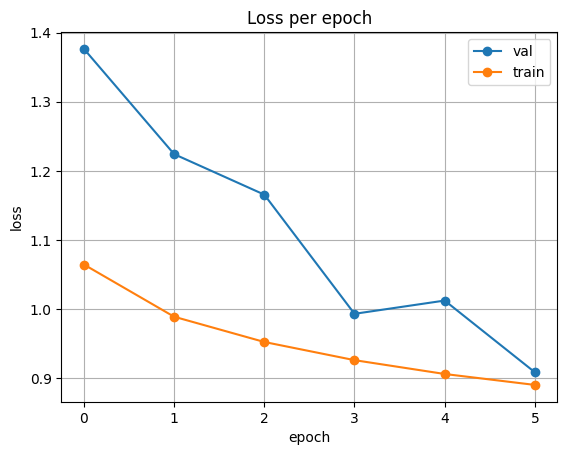

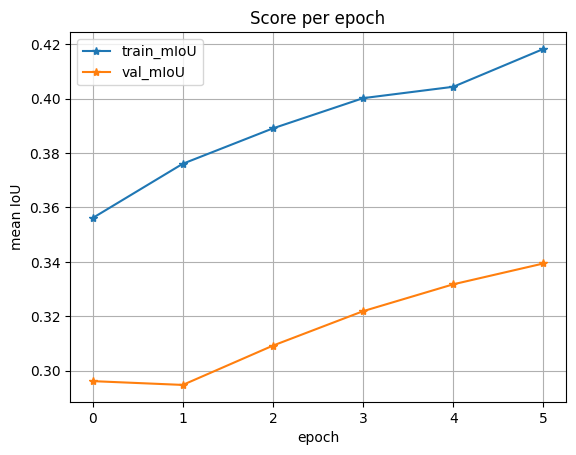

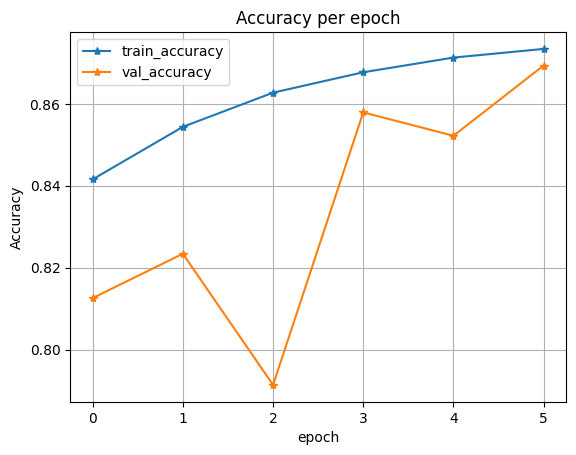

In [15]:
plot_loss(history, save_path='loss_plot.png')
plot_score(history, save_path='score_plot.png')
plot_acc(history, save_path='acc_plot.png')

# 6.2. Hyperparameter Tuning

The additional code used to apply hyperparameter tuning to our selected baseline model (U-Net) is below. As discussed in the Methods section, random search was applied to a range of parameters.

In [7]:
import random
learning_rate = random.uniform(0.001, 0.015)
momentum = random.uniform(0.5,0.9)
decay = random.uniform(0.001, 0.01)
batch_size = random.randint(2,16)

The results from our random search are shown in the image below.

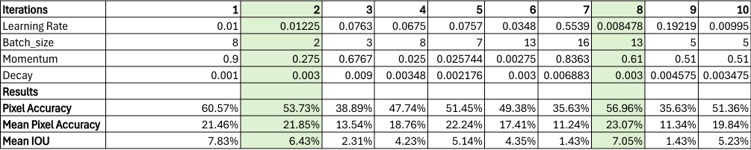



Taking the best parameters found, and applying them to our baseline yielded the results shown in the image below.

Hyperparameters:
- Learning rate: 0.002
- Batch size: 10
- Momentum: 0.7
- Weight decay: 0.003

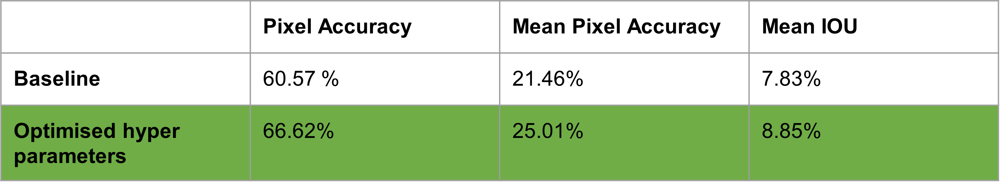




We see that the optimised hyperparameters yield significant improvements over our baseline model, so we will include this optimisation strategy in our final model.

# 6.3. ASPP Module

The additional code used to apply ASPP modules to our selected baseline model (U-Net) is below.

In [7]:
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels, rates=[6, 8, 12, 24, 36]):
        super(ASPP, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, dilation=1)
        
        self.conv2 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rates[0], dilation=rates[0])
        self.conv3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rates[1], dilation=rates[1])
        self.conv4 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rates[2], dilation=rates[2])
        self.conv5 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rates[3], dilation=rates[3])
        self.conv6 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=rates[3], dilation=rates[4])
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.conv7 = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, dilation=1)
        
        self.final_conv = nn.Conv2d(out_channels * 7, out_channels, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x)
        x3 = self.conv3(x)
        x4 = self.conv4(x)
        x5 = self.conv5(x)
        x6 = self.conv6(x)
        
        x7 = self.pool(x)
        x7 = self.conv5(x7)
        x7 = F.interpolate(x6, size=x.shape[2:], mode="bilinear", align_corners=False)
        
        x = torch.cat([x1, x2, x3, x4, x5, x6, x7], dim=1)
        x = self.final_conv(x)
        
        return x

In [8]:
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DecoderBlock, self).__init__()
        self.upsample = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x, skip):
        x = self.upsample(x)
        print(x.size())
        print(skip.size())
        skip = F.interpolate(skip, size=x.size[2:], mode="bilinear", align_corners=False)
        x = torch.cat([x, skip], dim=1)  # Concatenate skip connection
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        return x

In [9]:
class ResNetUNetASPP(nn.Module):
    def __init__(self, out_channels=256, num_classes=25):
        super(ResNetUNetASPP, self).__init__()
        # Load the ResNet encoder and remove the fully connected layer
        resnet = resnet50(pretrained=True)
        self.encoder_layers = nn.ModuleList(list(resnet.children())[:-2])
        
        # Define ASPP module with appropriate in_channels
        self.aspp = ASPP(in_channels=3, out_channels=out_channels)
        
        # Define U-Net decoder blocks with matching in_channels for skip connections
        self.decoder4 = DecoderBlock(256, 128)
        self.decoder3 = DecoderBlock(128, 64)
        self.decoder2 = DecoderBlock(64, 32)
        self.decoder1 = DecoderBlock(32, 16)
        
        # Final classification layer
        self.classifier = nn.Conv2d(16, num_classes, kernel_size=1)
        
    def forward(self, x):
        # Encode with ResNet and collect skip connections
        x_original = x
        skip_connections = []
        for i, layer in enumerate(self.encoder_layers):
            x = layer(x)
            if i in [4, 5, 6, 7]:  # Collect outputs from ResNet stages for skip connections
                skip_connections.append(x)
        
        # Reverse the skip connections for the decoder
        skip_connections = skip_connections[::-1]
        # Apply ASPP
        x = self.aspp(x_original)
        
        # Decode with U-Net blocks and skip connections
        x = self.decoder4(x, skip_connections[0])
        x = self.decoder3(x, skip_connections[1])
        x = self.decoder2(x, skip_connections[2])
        x = self.decoder1(x, skip_connections[3])
        
        # Final classification layer
        x = self.classifier(x)
        
        # Upsample to input size
        x = F.interpolate(x, scale_factor=4, mode='bilinear', align_corners=False)
        return x
    

In [10]:
model = ResNetUNetASPP(out_channels=256, num_classes=25)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 167MB/s]


In [11]:
import torchvision.models as models
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels, rates=[6, 12, 18]):
        super(ASPP, self).__init__()
        self.conv_1x1 = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.bn_1x1 = nn.BatchNorm2d(out_channels)
        
        self.conv_3x3_1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=rates[0], dilation=rates[0])
        self.bn_3x3_1 = nn.BatchNorm2d(out_channels)
        
        self.conv_3x3_2 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=rates[1], dilation=rates[1])
        self.bn_3x3_2 = nn.BatchNorm2d(out_channels)
        
        self.conv_3x3_3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=rates[2], dilation=rates[2])
        self.bn_3x3_3 = nn.BatchNorm2d(out_channels)
        
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv_1x1_pool = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.bn_pool = nn.BatchNorm2d(out_channels)
        
        self.output_conv = nn.Conv2d(out_channels * 5, out_channels, kernel_size=1)
        self.bn_output = nn.BatchNorm2d(out_channels)
        
    def forward(self, x):
        x1 = F.relu(self.bn_1x1(self.conv_1x1(x)))
        x2 = F.relu(self.bn_3x3_1(self.conv_3x3_1(x)))
        x3 = F.relu(self.bn_3x3_2(self.conv_3x3_2(x)))
        x4 = F.relu(self.bn_3x3_3(self.conv_3x3_3(x)))
        
        x5 = self.global_avg_pool(x)
        x5 = F.relu(self.bn_pool(self.conv_1x1_pool(x5)))
        x5 = F.interpolate(x5, size=x.shape[2:], mode='bilinear', align_corners=False)
        
        x = torch.cat([x1, x2, x3, x4, x5], dim=1)
        x = F.relu(self.bn_output(self.output_conv(x)))
        return x

class ResNetUNetASPP(nn.Module):
    def __init__(self, num_classes=1, aspp_out_channels=256):
        super(ResNetUNetASPP, self).__init__()
        
        # Encoder (ResNet)
        self.base_model = models.resnet34(pretrained=True)
        self.base_layers = list(self.base_model.children())
        
        self.encoder1 = nn.Sequential(*self.base_layers[:3])   # 64, 128x128
        self.encoder2 = nn.Sequential(*self.base_layers[3:5])  # 64, 64x64
        self.encoder3 = self.base_layers[5]                    # 128, 32x32
        self.encoder4 = self.base_layers[6]                    # 256, 16x16
        self.encoder5 = self.base_layers[7]                    # 512, 8x8
        
        # ASPP module
        self.aspp = ASPP(512, aspp_out_channels)
        
        # Decoder
        self.decoder4 = self.conv_block(aspp_out_channels + 256, 256)
        self.decoder3 = self.conv_block(256 + 128, 128)
        self.decoder2 = self.conv_block(128 + 64, 64)
        self.decoder1 = self.conv_block(64 + 64, 64)
        
        # Final classifier
        self.classifier = nn.Conv2d(64, num_classes, kernel_size=1)
        
    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)   # 64, 128x128
        enc2 = self.encoder2(enc1) # 64, 64x64
        enc3 = self.encoder3(enc2) # 128, 32x32
        enc4 = self.encoder4(enc3) # 256, 16x16
        enc5 = self.encoder5(enc4) # 512, 8x8
        
        # ASPP
        aspp_out = self.aspp(enc5) # 256, 8x8
        
        # Decoder with skip connections
        dec4 = F.interpolate(aspp_out, scale_factor=2, mode='bilinear', align_corners=False)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.decoder4(dec4)
        
        dec3 = F.interpolate(dec4, scale_factor=2, mode='bilinear', align_corners=False)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.decoder3(dec3)
        
        dec2 = F.interpolate(dec3, scale_factor=2, mode='bilinear', align_corners=False)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.decoder2(dec2)
        
        dec1 = F.interpolate(dec2, scale_factor=2, mode='bilinear', align_corners=False)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.decoder1(dec1)
        
        # Classifier
        out = self.classifier(dec1)
        out = F.interpolate(out, scale_factor=2, mode='bilinear', align_corners=False)
        return out

# Instantiate model
model = ResNetUNetASPP(num_classes=25)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 159MB/s]


Results from applying various numbers of convolutional components are compared with baseline results in the below image.

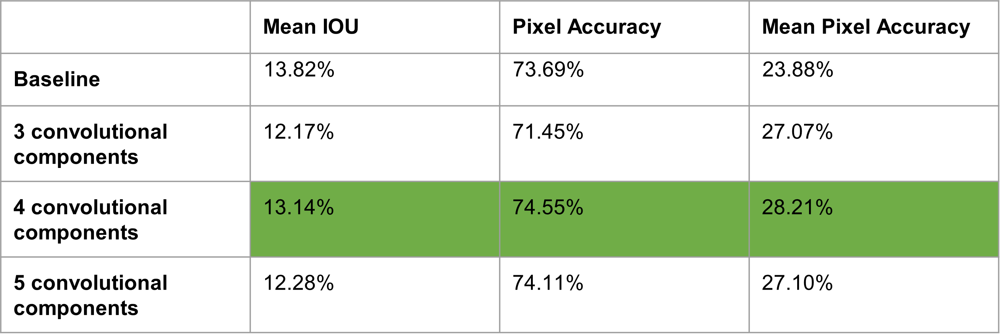



We see that the best performance was achieved when applying 4 convolutional components, and this yielded better pixel accuracy and mean pixel accuracy results than the baseline alone. So, we will include ASPP Modules in our final model.

# 6.4. Data Augmentation

Our data augmentation methods involved generating new synthetic images and adding them to training datasets. This section provides any extra code required on top of the baseline training and testing code to implement these methods, along with results achieved for each method.

# 6.4.1. Cropping and Resizing

To implement this method, we needed an algorithm to located connected regions of rare classses, create bounding boxes around them, and extract them and re-scale them to full-size images to be added to the training set. The functions required to implement this are provided below.

In [2]:
import os
from PIL import Image
import numpy as np
import torch
from skimage.measure import label
from skimage.measure import label, regionprops
from torchvision import transforms

resize_shape = (256, 256)

# Set up directories for saving augmented images and masks
augmented_image_dir = "/kaggle/working/augmented_images"
augmented_mask_dir = "/kaggle/working/augmented_masks"
os.makedirs(augmented_image_dir, exist_ok=True)
os.makedirs(augmented_mask_dir, exist_ok=True)

# Define transformation to apply to resized images
image_transform = transforms.Resize(resize_shape, interpolation=Image.NEAREST)

mask_transform = transforms.Resize(resize_shape, interpolation=Image.NEAREST)

def extract_and_augment_regions(image_paths, annotation_paths, target_classes,resize_shape=(256, 256)):
    augmented_images = []
    augmented_masks = []
    
    for idx, (image_path, annotation_path) in enumerate(zip(image_paths, annotation_paths)):
        image = Image.open(image_path).convert('RGB')
        annotation = Image.open(annotation_path).convert('RGB')
        annotation_tensor = rgb_to_class_index(annotation)
        
        # Find connected regions for the target class
        for target_class in target_classes:
            
            regions = get_class_connected_regions(annotation_tensor, target_class)
        
            for region_num, region in enumerate(regions):
                # Crop the region from image and mask using bounding box coordinates
                min_row, min_col, max_row, max_col = region.bbox
                width, height = max_col - min_col, max_row - min_row
                
                # Skip if the area is too small
                if width * height < 10000: # if area is less than 10000 pixels, don't resize this image up to 256 x 256
                    continue
                
                cropped_image = image.crop((min_col, min_row, max_col, max_row))
                cropped_mask = annotation.crop((min_col, min_row, max_col, max_row))

                # Resize the cropped image and mask
                resized_image = image_transform(cropped_image)
                resized_mask = mask_transform(cropped_mask)

                # Save new image to the augmented directories
                aug_image_path = os.path.join(augmented_image_dir, f"aug_image_{target_class}_{idx}_{region_num}.png")
                aug_mask_path = os.path.join(augmented_mask_dir, f"aug_mask_{target_class}_{idx}_{region_num}.png")

                resized_image.save(aug_image_path)
                resized_mask.save(aug_mask_path)

                # Store paths for future dataset inclusion
                augmented_images.append(aug_image_path)
                augmented_masks.append(aug_mask_path)
                
    return augmented_images, augmented_masks

def rgb_to_class_index(annotation):
    annotation_np = np.array(annotation)
    mask = np.zeros(annotation_np.shape[:2], dtype=np.int64)
    for rgb, idx in colour_map.items():
        mask[(annotation_np == rgb).all(axis=-1)] = idx
    return torch.from_numpy(mask)

def get_class_connected_regions(annotation_tensor, target_class):
    binary_mask = (annotation_tensor == target_class).numpy().astype(np.uint8)
    labeled_mask = label(binary_mask)
    regions = regionprops(labeled_mask)
    return regions


def get_image_annotation_paths(image_dir, annotation_dir, sequences):
    image_paths = []
    annotation_paths = []
    valid_extensions = {".png"}

    for seq in sequences:
        img_seq_dir = os.path.join(image_dir, seq)
        ann_seq_dir = os.path.join(annotation_dir, seq)

        # Get all valid image files in each directory
        img_files = {f for f in os.listdir(img_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}
        ann_files = {f for f in os.listdir(ann_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}

        # Intersect file sets to get matching files by name
        common_files = img_files.intersection(ann_files)
        
        for file_name in sorted(common_files):
            image_paths.append(os.path.join(img_seq_dir, file_name))
            annotation_paths.append(os.path.join(ann_seq_dir, file_name))

    return image_paths, annotation_paths

# Usage example
image_dir = '/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_frames-with-annotations/RUGD_frames-with-annotations'
annotation_dir = '/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_annotations/RUGD_annotations'
train_sequences = ['park-2']

# Get paths for the training set
train_image_paths, train_annotation_paths = get_image_annotation_paths(image_dir, annotation_dir, train_sequences)

An example of an implementation of this approach is shown below. As you can see in the images produced, rare classes such as buildings and cars are identified and re-scaled to full-size images.

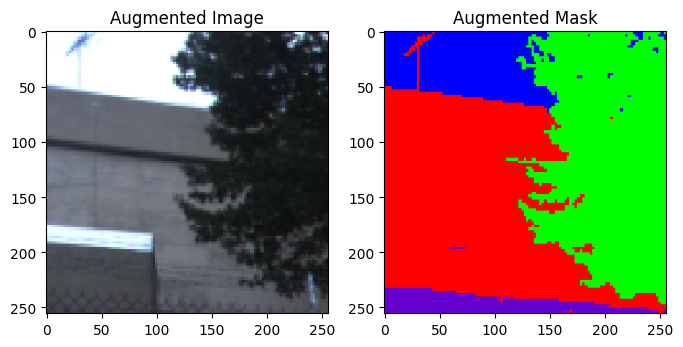

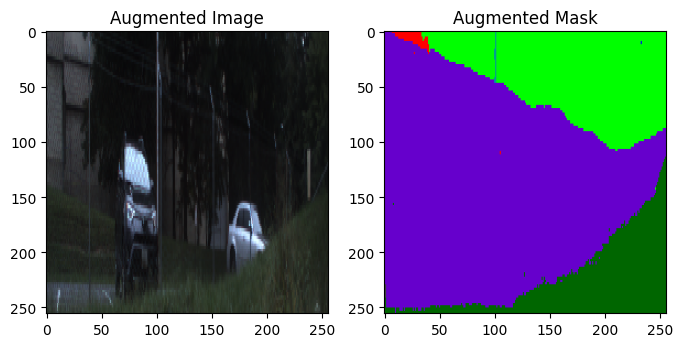

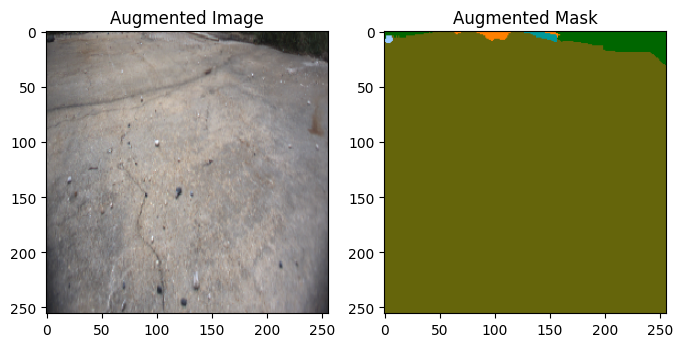

In [3]:
# Extract and augment regions
augmented_images, augmented_masks = extract_and_augment_regions(train_image_paths, train_annotation_paths, [1, 2, 5, 6, 8, 9, 10, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24])

# Display a few examples from the augmented images
import matplotlib.pyplot as plt

for i in range(3):  # Display first 3 examples
    img = Image.open(augmented_images[i])
    mask = Image.open(augmented_masks[i])
    
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    ax[0].imshow(img)
    ax[0].set_title("Augmented Image")
    ax[1].imshow(mask)
    ax[1].set_title("Augmented Mask")
    plt.show()

Due to limits in available computational resources, we didn't train full-size models on all of the augmented images generated from this approach, but rather ran smaller experiments on subsets of the total training set to observe performance.

In summary, while this method was successful in balancing class distributions, the upsizing process lead to distorted images, causing the model to learn bad features, reducing overall performance.

So, we decided **not** to include this method in our final model.

# 6.4.2. CutMix + StickerMix

Our implementation of CutMix showed some success in rebalancing the class distribution, as shown in the image below. You can see that the representation of classes like trees and grass has gone down significantly, and some less represented classes have increased. Note that we have omitted the code used for CutMix as it is very similar to the StickerMix code which will follow.

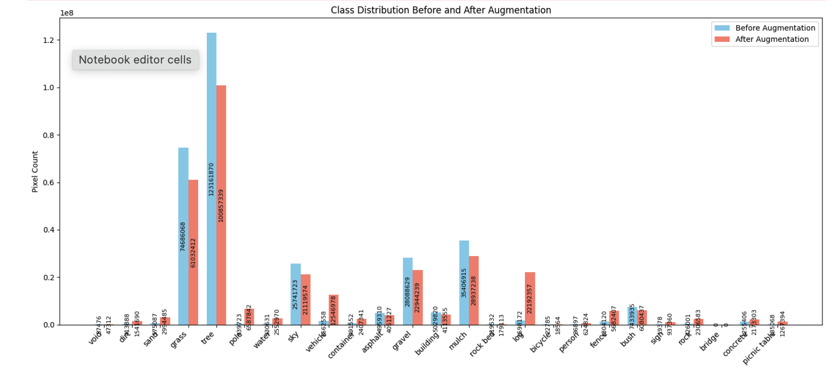

However, the CutMix approach proved to be too computationally demanding, since we were resizing every cropped region to a very small size before pasting them, which meant high numbers of regions needed to be pasted to achieve effective results.

This lead us to implementing StickerMix, as described in previous sections. The code for the implementation of StickerMix is below. It involved creating various functions to locate connected rare regions, collect and save stickers, apply these stickers randomly to images, and add the augmented images into the training set. Note that we've included a copy of the dataset class code here as some tweaks were made to it for StickerMix implementation.

In [3]:
import os
from PIL import Image
import numpy as np
import torch
from skimage.measure import label
from skimage.measure import label, regionprops
from torchvision import transforms
import random


# Set up directories for saving augmented images and masks
augmented_image_dir = "/kaggle/working/augmented_images"
augmented_mask_dir = "/kaggle/working/augmented_masks"
os.makedirs(augmented_image_dir, exist_ok=True)
os.makedirs(augmented_mask_dir, exist_ok=True)

def collect_stickers(image_paths, annotation_paths, target_classes, min_area=5000):
    stickers = []  # List to store sticker tuples (image_patch, mask_patch)
    
    for idx, (image_path, annotation_path) in enumerate(zip(image_paths, annotation_paths)):
        print(idx)
        image = Image.open(image_path).convert('RGB')
        annotation = Image.open(annotation_path).convert('RGB')
        annotation_tensor = rgb_to_class_index(annotation)
        
        for target_class in target_classes:
            regions = get_class_connected_regions(annotation_tensor, target_class)
        
            for region_num, region in enumerate(regions):
                # Crop the region from image and mask using bounding box coordinates
                min_row, min_col, max_row, max_col = region.bbox
                width, height = max_col - min_col, max_row - min_row

                if width * height < min_area:
                    continue  # Skip if the region is too small

                cropped_image = image.crop((min_col, min_row, max_col, max_row))
                cropped_mask = annotation.crop((min_col, min_row, max_col, max_row))

                # Store the sticker (image_patch, mask_patch)
                stickers.append((cropped_image, cropped_mask))

    return stickers


import numpy as np

import matplotlib.pyplot as plt

def apply_stickers_to_images(image_paths, annotation_paths, stickers, num_stickers=20):
    augmented_images = []
    augmented_masks = []
    
    for image_path, annotation_path in zip(image_paths, annotation_paths):
        image = Image.open(image_path).convert('RGB')
        mask = Image.open(annotation_path).convert('RGB')

        # Convert images and masks to NumPy arrays
        image_np = np.array(image, dtype=np.uint8)
        mask_np = np.array(mask, dtype=np.uint8)

        for _ in range(num_stickers):
            sticker_img, sticker_mask = random.choice(stickers)

            # Convert stickers to NumPy arrays and ensure dtype is uint8
            sticker_img_np = np.array(sticker_img, dtype=np.uint8)
            sticker_mask_np = np.array(sticker_mask, dtype=np.uint8)


            # Continue with pasting logic (same as before)
            sticker_w, sticker_h = sticker_img.size
            if sticker_w > image_np.shape[1] or sticker_h > image_np.shape[0]:
                continue

            x_offset = random.randint(0, image_np.shape[1] - sticker_w)
            y_offset = random.randint(0, image_np.shape[0] - sticker_h)

            mask_region = sticker_mask_np.any(axis=-1)  # Boolean mask for where sticker mask has content

            # Apply stickers only to the masked region
            image_np[y_offset:y_offset + sticker_h, x_offset:x_offset + sticker_w][mask_region] = \
                sticker_img_np[mask_region]

            mask_np[y_offset:y_offset + sticker_h, x_offset:x_offset + sticker_w][mask_region] = \
                sticker_mask_np[mask_region]

        # Convert back to PIL Image format
        augmented_image = Image.fromarray(image_np)
        augmented_mask = Image.fromarray(mask_np)

        augmented_images.append(augmented_image)
        augmented_masks.append(augmented_mask)

    return augmented_images, augmented_masks





def rgb_to_class_index(annotation):
    annotation_np = np.array(annotation)
    mask = np.zeros(annotation_np.shape[:2], dtype=np.int64)
    for rgb, idx in colour_map.items():
        mask[(annotation_np == rgb).all(axis=-1)] = idx
    return torch.from_numpy(mask)

def class_index_to_rgb(mask_np, colour_map):
    # Create an RGB array filled with zeros
    rgb_mask = np.zeros((*mask_np.shape, 3), dtype=np.uint8)
    
    # Map each class index to its RGB color
    for rgb, idx in colour_map.items():
        rgb_mask[mask_np == idx] = rgb

    return Image.fromarray(rgb_mask)

def get_class_connected_regions(annotation_tensor, target_class):
    binary_mask = (annotation_tensor == target_class).numpy().astype(np.uint8)
    labeled_mask = label(binary_mask)
    regions = regionprops(labeled_mask)  # Get properties of each connected region
    return regions


def get_image_annotation_paths(image_dir, annotation_dir, sequences):
    image_paths = []
    annotation_paths = []
    valid_extensions = {".png", ".jpg", ".jpeg", ".tif", ".bmp"}

    for seq in sequences:
        img_seq_dir = os.path.join(image_dir, seq)
        ann_seq_dir = os.path.join(annotation_dir, seq)

        # Get all valid image files in each directory
        img_files = {f for f in os.listdir(img_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}
        ann_files = {f for f in os.listdir(ann_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}

        # Intersect file sets to get matching files by name
        common_files = img_files.intersection(ann_files)
        
        for file_name in sorted(common_files):
            image_paths.append(os.path.join(img_seq_dir, file_name))
            annotation_paths.append(os.path.join(ann_seq_dir, file_name))

    return image_paths, annotation_paths

# Usage example
image_dir = '/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_frames-with-annotations/RUGD_frames-with-annotations'
annotation_dir = '/kaggle/input/rugd-terrain-recognition/RUGD/RUGD_annotations/RUGD_annotations'
train_sequences = ['park-2','trail', 'trail-3', 'trail-3', 'trail-4', 'trail-6', 'trail-9', 'trail-10', 'trail-11', 'trail-12', 'trail-14', 'trail-15', 'village']

# Get paths for the training set
train_image_paths, train_annotation_paths = get_image_annotation_paths(image_dir, annotation_dir, train_sequences)

In [6]:
import os
from PIL import Image
from torch.utils.data import Dataset
import torch
import numpy as np
from torchvision import transforms

class RUGDDataset(Dataset):
    def __init__(self, image_dir, annotation_dir, colour_map, split='train', transform=None, mask_transform=None):
        self.image_dir = image_dir
        self.annotation_dir = annotation_dir
        self.colour_map = colour_map
        self.transform = transform
        self.mask_transform = mask_transform
        self.split = split

        # Define which sequences to use based on the split
        if self.split == 'train':
            self.sequences = ['park-2', 'trail', 'trail-3', 'trail-4', 'trail-6', 'trail-9', 'trail-10', 'trail-11', 'trail-12', 'trail-14', 'trail-15', 'village']
        elif self.split == 'val':
            self.sequences = ['park-8', 'trail-5']
        elif self.split == 'test':
            self.sequences = ['creek', 'park-1', 'trail-7', 'trail-13']

        # Get all matched image and annotation paths
        self.image_paths, self.annotation_paths = self._get_paths()
        

    def _get_paths(self):
        image_paths = []
        annotation_paths = []
        valid_extensions = {".png", ".jpg", ".jpeg", ".tif", ".bmp"}

        for seq in self.sequences:
            img_seq_dir = os.path.join(self.image_dir, seq)
            ann_seq_dir = os.path.join(self.annotation_dir, seq)

            # Get all valid image files in each directory
            img_files = {f for f in os.listdir(img_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}
            ann_files = {f for f in os.listdir(ann_seq_dir) if os.path.splitext(f)[-1].lower() in valid_extensions}

            # Intersect file sets to get matching files by name
            common_files = img_files.intersection(ann_files)
            
            for file_name in sorted(common_files):
                image_paths.append(os.path.join(img_seq_dir, file_name))
                annotation_paths.append(os.path.join(ann_seq_dir, file_name))
                
        # Add paths from augmented directories if we're in the training split
        if self.split == 'train':
            augmented_image_dir = "/kaggle/working/augmented_images"
            augmented_mask_dir = "/kaggle/working/augmented_masks"

            # Get all augmented image and mask paths
            augmented_image_paths = sorted([os.path.join(augmented_image_dir, f) 
                                            for f in os.listdir(augmented_image_dir) 
                                            if os.path.splitext(f)[-1].lower() in valid_extensions])
            augmented_mask_paths = sorted([os.path.join(augmented_mask_dir, f) 
                                           for f in os.listdir(augmented_mask_dir) 
                                           if os.path.splitext(f)[-1].lower() in valid_extensions])

            # Append augmented paths to the training data paths
            image_paths.extend(augmented_image_paths)
            annotation_paths.extend(augmented_mask_paths)

        return image_paths, annotation_paths

    def _rgb_to_class_index(self, annotation):
        annotation_np = np.array(annotation)
        mask = np.zeros(annotation_np.shape[:2], dtype=np.int64)
        for rgb, idx in self.colour_map.items():
            mask[(annotation_np == rgb).all(axis=-1)] = idx
        return torch.from_numpy(mask)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):      
        # Load image and annotation
        image = Image.open(self.image_paths[idx]).convert('RGB')
        annotation = Image.open(self.annotation_paths[idx]).convert('RGB')
        
        # Apply transform to image if provided
        if self.transform:
            image = self.transform(image)

        # Apply mask transform if provided (resize to match image)
        if self.mask_transform:
            annotation = self.mask_transform(annotation)

        # Convert annotation to class index mask
        annotation = self._rgb_to_class_index(annotation)
        
        return image, annotation

We decided to test the effectiveness of StickerMix on a single underrepresented class, Class 12 (Buildings). We used StickerMix to increase the representation of Buildings in the training set, and plotted results for how the model improved for this particular class after having StickerMix applied to it. Specifically, we increase the representation of Buildings (i.e. the percentage of pixels in the dataset that were are buildings) to various percentages, such as 5% and 20%, and calculated model performance on those classes. The results obtained are summarised in the images below.

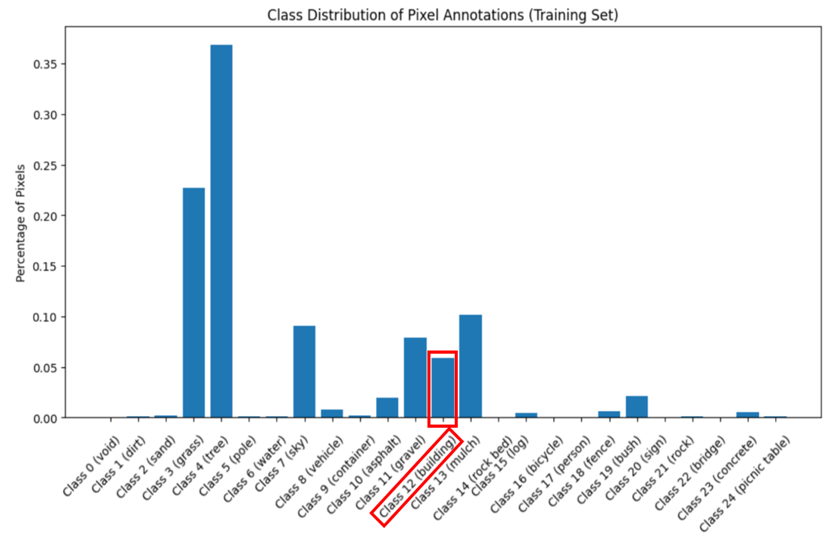

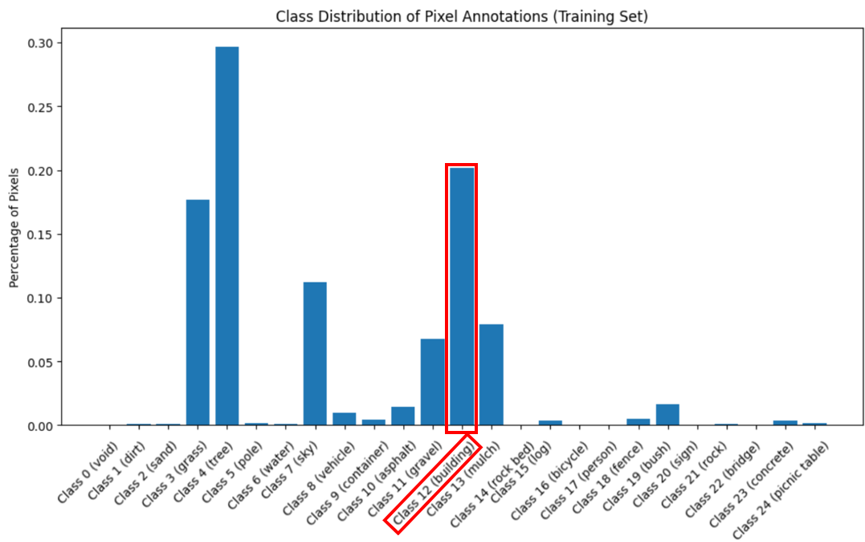

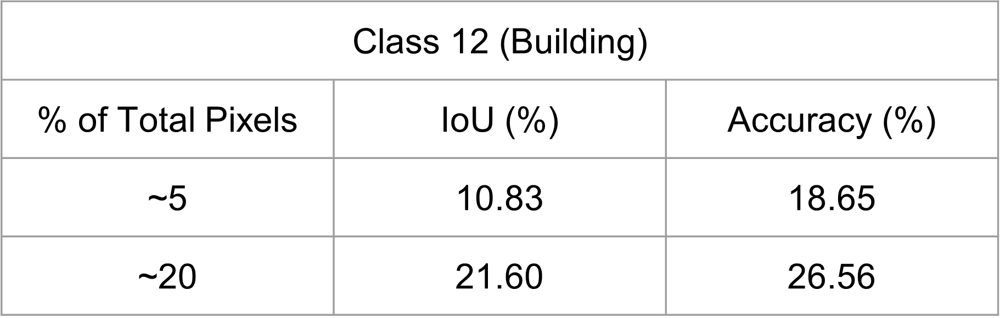




As shown in the table above, increasing the representation of the Building class in the dataset showed significant improvements in model performance for that class.

Since StickerMix has yet to be verified across all classes, we have **omitted** StickerMix from the final model, however we believe that with more time, more computational resources, and some more refinements to the StickerMix algorithm, this novel approach could significantly improve overall semantic segmentation model performance in unstructured environments.

# 6.5. Class-Aware Loss Weighting

Overall, the best performance improvement obtained through class-aware loss weighting was by using logit inverse weighting formula. Pixel accuracy and mean IOU increased, but decreased mean pixel accuracy by 0.58%.

Since pixel accuracy increased, we decided to **include** this optimisation strategy, with logit inverse weighting, to the final model.

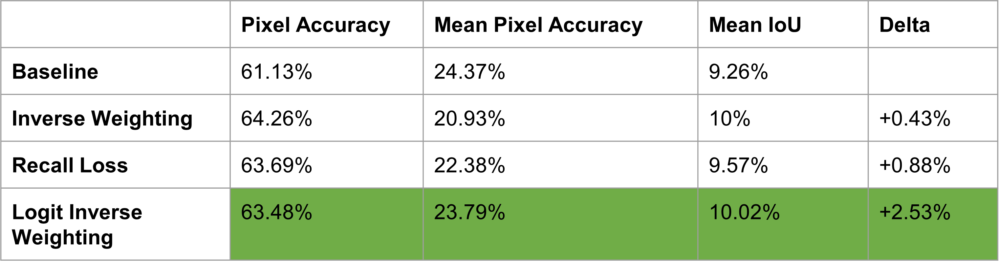


# 6.6. Final Model

According to our overall approach (i.e., trialing various optimisation methods on the best baseline and adopting the ones that worked), the optimisation methods chosen to be included in our final model are shown in the image below.

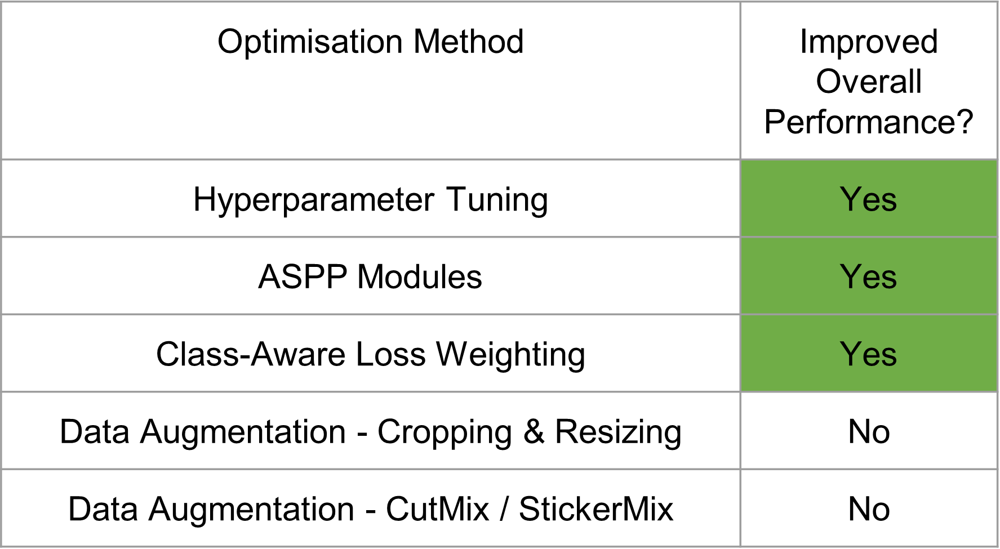

So, our final model was a U-Net model with hyperparameter tuning, ASPP modules, and class-aware loss weighting implemented.

The implementation of each part of this model is the same as in the individual component implementations, as outlined in previous sections, so we have omitted the code from this section. 

The results of the final model are compared with the baseline model results in the image below.

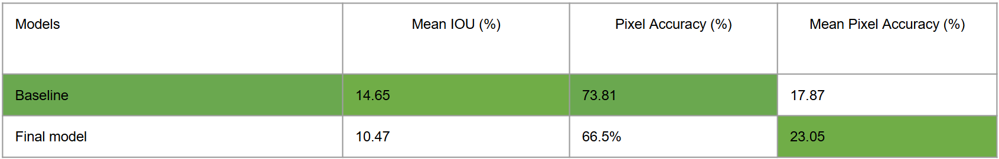

The final model, combining all of the successful optimisation strategies, performs worse than the original baseline model overall. Discussions surrounding this result are provided in the following section.

# 7. Discussion

The aim of our approach was to enhance baseline model performance on the RUGD dataset through selected optimisation strategys after trialing a series of different ones. As we saw in the results, the following optimisation methods showed improvements when applied individually:
- Hyperparameter Tuning
- ASPP Modules
- Class-Aware Loss Weighting

Unfortunately, as we saw in the final model, the combination of each these methods didn't lead to overall improvements in the model performance, and in fact, our final model performed worse overall than the baseline model alone. This outcome provides some key insights into the nature of the problem and deep learning tasks in general. It highlights that in many deep learning problems, various optimisation strategies can be incompatible with one another. Each method targets different aspects of the model's learning process, and simultaneous application of them can cause interference between the benefits of each indiviual method. Despite the lower overall performance when combining optimisation methods, our project has still made significant contributions to this problem.


**Contributions**

 We note that while the combination of these methods didn't lead to overall improvements, applying these methods individually still show significant improvements, which are contributions in themselves. So, we advise that our methods of hyperparameter tuning, ASPP modules, and class-aware loss weighting can be adopted individually to existing models for improved performance on semantic segmentation in unstructured environments.

The optimisation strategies that did not yield improvements are contributions in themselves, as they provide insight as to which approaches are not feasible for semantic segmentation in unstructured environments, and therefore may guide future research directions.

Finally, we have made significant contributions in class-specific performance through the creation of novel data augmentation techniques. Specifically, we introduced StickerMix, a novel method designed to improve class-specific performance in unstructured environments. By applying StickerMix, we have shown that model performance on specific classes can be improved significantly by increasing its representation in the training dataset. We propose that this method has significant potential for various applications. For example, if a robot is needed to traverse an environment consisting mainly of buildings and dirt, models can be fine-tuned on these classes with StickerMix, to achieve better overall performance in that environment. While this approach is yet to be verified across all classes and generalised to improve overall performance across all classes, we believe that StickerMix has great potential for further developments in subsequent research efforts, and can play a significant role in improving the performance of robots in various real-world scenarios.

**Limitations and Future Work**

A big limitation of our final model is that it can still not accurately assign labels even though it can identify segment boundaries quite well. This is especially the case for less frequent classes. In the case of the ground scenes, the model often mistakes the ground materials, such as logs for mulch, and rock for bush. Another limitation in this project was the limited GPU access, which led to downscaling data and using fewer epochs when evaluating methods.

For future works, we would like to explore using automated pixel count statistics to determine how many stickers each class to paste in the StickerMix method, instead of randomly assigning stickers. This aims to create a flatter class distribution and address imbalance dynamically. Another future area to explore is using a learnable GAN that produces accurate class images. We hope that the various methods we have applied to this problem provide support and guidance for future research efforts in addressing the problem of robot scene understanding and navigation in unstructured environments.